<a href="https://colab.research.google.com/github/amirshane/protein-embedding-retrieval/blob/master/tape_contextual_lenses.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [ ]:
# Install the newest JAX and FLAX versions.
!pip install --upgrade -q jax>=0.1.75 jaxlib>=0.1.52 flax>=0.2.0 torch>=1.6.0

In [ ]:
import requests
import os
if 'TPU_DRIVER_MODE' not in globals():
  url = 'http://' + os.environ['COLAB_TPU_ADDR'].split(':')[0] + ':8475/requestversion/tpu_driver_nightly'
  resp = requests.post(url)
  TPU_DRIVER_MODE = 1

# The following is required to use TPU Driver as JAX's backend.
from jax.config import config
config.enable_omnistaging()
config.FLAGS.jax_xla_backend = "tpu_driver"
config.FLAGS.jax_backend_target = "grpc://" + os.environ['COLAB_TPU_ADDR']
print(config.FLAGS.jax_backend_target)

grpc://10.82.72.98:8470


In [ ]:
import functools
import itertools
import os
import time
import copy

import flax
from flax import jax_utils
from flax import nn
from flax import optim
from flax.metrics import tensorboard
from flax.training import checkpoints
from flax.training import common_utils

import jax
from jax import random
from jax import lax
import jax.nn
import jax.numpy as jnp
from jax.experimental.stax import BatchNorm

import tensorflow as tf

import numpy as np

import pandas as pd

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import scipy.stats

import sklearn
import sklearn.linear_model
import sklearn.metrics as metrics
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import seaborn as sns

import pprint

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## pip install tape

In [ ]:
!git clone https://github.com/songlab-cal/tape
!pip install -q -r tape/requirements.txt
%cd tape

Cloning into 'tape'...
remote: Enumerating objects: 1647, done.
remote: Total 1647 (delta 0), reused 0 (delta 0), pack-reused 1647
Receiving objects: 100% (1647/1647), 820.04 KiB | 5.99 MiB/s, done.
Resolving deltas: 100% (1122/1122), done.
     |████████████████████████████████| 753.4MB 18kB/s 
     |████████████████████████████████| 317kB 54.2MB/s 
     |████████████████████████████████| 2.3MB 52.4MB/s 
ERROR: torchvision 0.7.0+cu101 has requirement torch==1.6.0, but you'll have torch 1.4.0 which is incompatible.
/content/tape


In [ ]:
import tape
from tape.datasets import LMDBDataset

# Utils

## Contextual lenses

In [ ]:
def flatten(x, padding_mask=None):
  """Apply padding, flatten over sequence length axis."""

  if padding_mask is not None:
    x = x * padding_mask

  rep = x.reshape(x.shape[0], x.shape[1]*x.shape[2])

  return rep

In [ ]:
def max_pool(x, padding_mask=None, pad_constant=1e8):
  """Apply padding, take maximum over sequence length axis."""

  if padding_mask is not None:
    x = x * padding_mask
    neg_mask = - pad_constant * (1 - padding_mask)
    x = x + neg_mask
   
  rep = jnp.max(x, axis=-2)
   
  return rep


def mean_pool(x, padding_mask=None):
  """Apply padding, take mean over sequence length axis."""

  if padding_mask is not None:
    x = x * padding_mask
    rep = jnp.sum(x, axis=-2) / jnp.sum(padding_mask, axis=-2)
  else:
    rep = jnp.mean(x, axis=-2)

  return rep


def linear_max_pool(x, rep_size, padding_mask=None):
  """Apply linear transformation + ReLU, apply padding,
     take maximum over sequence length.
  """
  
  x = nn.Dense(
        x,
        rep_size,
        kernel_init=nn.initializers.xavier_uniform(),
        bias_init=nn.initializers.normal(stddev=1e-6))
  
  x = nn.relu(x)

  rep = max_pool(x, padding_mask=padding_mask)
  
  return rep


def linear_mean_pool(x, rep_size, padding_mask=None):
  """Apply linear transformation + ReLU, apply padding,
     take mean over sequence length.
  """
    
  x = nn.Dense(
        x,
        rep_size,
        kernel_init=nn.initializers.xavier_uniform(),
        bias_init=nn.initializers.normal(stddev=1e-6))
  
  x = nn.relu(x)
  
  rep = mean_pool(x, padding_mask=padding_mask)
  
  return rep

In [ ]:
class GatedConv(nn.Module):
  """Gated Convolutional lens followed by max pooling,
     see original paper for details.
  """

  def apply(self, x, rep_size, m_layers, m_features, m_kernel_sizes, conv_rep_size, padding_mask=None):
        
    H_0 = nn.relu(nn.Dense(x, conv_rep_size))
    G_0 = nn.relu(nn.Dense(x, conv_rep_size))
    H, G = jnp.expand_dims(H_0, axis=2), jnp.expand_dims(G_0, axis=2)

    for layer in range(1, m_layers+1):
      
      if layer < m_layers:
        H_features, G_features = m_features[layer-1]
      else:
        H_features, G_features = conv_rep_size, conv_rep_size
      
      H_kernel_size, G_kernel_size = m_kernel_sizes[layer-1]

      H = nn.Conv(H, features=H_features, kernel_size=(H_kernel_size, 1))
      G = nn.Conv(G, features=G_features, kernel_size=(G_kernel_size, 1)) 

      if layer < m_layers:
        H = nn.relu(H)
        G = nn.relu(G)
      else:
        H = nn.tanh(H)
        G = nn.sigmoid(G)

    H, G = jnp.squeeze(H, axis=2), jnp.squeeze(G, axis=2)
    
    F = H * G + G_0
    
    rep = linear_max_pool(F, padding_mask=padding_mask, rep_size=rep_size)
    
    return rep


def gated_conv(x, rep_size, m_layers, m_features, m_kernel_sizes, conv_rep_size, padding_mask=None):
  """Calls GatedConv method for use as a lens."""

  rep = GatedConv(x, rep_size=rep_size, m_features=m_features, m_layers=m_layers, m_kernel_sizes=m_kernel_sizes, 
                  conv_rep_size=conv_rep_size, padding_mask=padding_mask)
  
  return rep

## Loss functions

In [ ]:
def mse_loss(Y, Y_hat):
    """Squeezes predictions and returns MSE loss."""
    
    if len(Y_hat.shape) > 1:
        Y_hat = jnp.squeeze(Y_hat, axis=1)
    
    loss = jnp.mean(jnp.square(Y-Y_hat))
    
    return loss
    

def cross_entropy_loss(Y, Y_hat, num_classes):
    """Applies log-softmax to predictions and one-hot encodes true values
       to compute and return cross-entropy loss.
    """
        
    Y_hat = jax.nn.log_softmax(Y_hat)
    
    Y = jax.nn.one_hot(Y, num_classes=num_classes)
    
    loss = - jnp.sum(Y * Y_hat)
    
    return loss

## Encoders

In [ ]:
def one_hot_encoder(batch_inds, num_categories):
  """Applies one-hot encoding from jax.nn."""

  one_hots = jax.nn.one_hot(batch_inds, num_classes=num_categories)
  
  return one_hots


def flattened_one_hot_encoder(batch_inds, num_categories):
  """Flattens padded one-hot encoding from jax.nn."""
  
  padding_mask = jnp.expand_dims(jnp.where(batch_inds < num_categories-1, 1, 0), axis=2)
  
  one_hots = one_hot_encoder(batch_inds, num_categories)
  flattened_one_hots = flatten(one_hots, padding_mask)

  return flattened_one_hots


class CNN(nn.Module):
  """A simple 1D CNN model."""

  def apply(self, x, n_layers, n_features, n_kernel_sizes):
    
    x = jnp.expand_dims(x, axis=2)

    for layer in range(n_layers):
      features = n_features[layer]
      kernel_size = (n_kernel_sizes[layer], 1)
      x = nn.Conv(x, features=features, kernel_size=kernel_size)
      x = nn.relu(x)
    
    x = jnp.squeeze(x, axis=2)

    return x


def cnn_one_hot_encoder(batch_inds, num_categories, n_layers, n_features, n_kernel_sizes):
  """Applies one-hot encoding followed by 1D CNN."""

  one_hots = one_hot_encoder(batch_inds, num_categories)
  cnn_one_hots = CNN(one_hots, n_layers, n_features, n_kernel_sizes)
  
  return cnn_one_hots


In [ ]:
def sinusoidal_init(max_len=2048,
                    min_scale=1.0,
                    max_scale=10000.0):
  """1D Sinusoidal Position Embedding Initializer.
  Args:
      max_len: maximum possible length for the input.
      min_scale: float: minimum frequency-scale in sine grating.
      max_scale: float: maximum frequency-scale in sine grating.
  Returns:
      output: init function returning `(1, max_len, d_feature)`
  """

  def init(key, shape, dtype=np.float32):
    """Sinusoidal init."""
    del key, dtype
    d_feature = shape[-1]
    pe = np.zeros((max_len, d_feature), dtype=np.float32)
    position = np.arange(0, max_len)[:, np.newaxis]
    scale_factor = -np.log(max_scale / min_scale) / (d_feature // 2 - 1)
    div_term = min_scale * np.exp(np.arange(0, d_feature // 2) * scale_factor)
    pe[:, :d_feature // 2] = np.sin(position * div_term)
    pe[:, d_feature // 2: 2 * (d_feature // 2)] = np.cos(position * div_term)
    pe = pe[np.newaxis, :, :]  # [1, max_len, d_feature]
    return jnp.array(pe)

  return init

class AddPositionEmbs(nn.Module):
  """Adds (optionally learned) positional embeddings to the inputs."""

  def apply(self,
            inputs,
            inputs_positions=None,
            max_len=512,
            posemb_init=nn.initializers.normal(stddev=1e-6),
            cache=None):
    """Applies AddPositionEmbs module.
    By default this layer uses a fixed sinusoidal embedding table. If a
    learned position embedding is desired, pass an initializer to
    posemb_init.
    Args:
      inputs: input data.
      inputs_positions: input position indices for packed sequences.
      max_len: maximum possible length for the input.
      posemb_init: positional embedding initializer, if None, then use a
        fixed (non-learned) sinusoidal embedding table.
      cache: flax attention cache for fast decoding.
    Returns:
      output: `(bs, timesteps, in_dim)`
    """
    # inputs.shape is (batch_size, seq_len, emb_dim)
    assert inputs.ndim == 3, ('Number of dimensions should be 3,'
                              ' but it is: %d' % inputs.ndim)
    length = inputs.shape[1]
    pos_emb_shape = (1, max_len, inputs.shape[-1])
    if posemb_init is None:
      # Use a fixed (non-learned) sinusoidal position embedding.
      pos_embedding = sinusoidal_init(
          max_len=max_len)(None, pos_emb_shape, None)
    else:
      pos_embedding = self.param('pos_embedding', pos_emb_shape, posemb_init)
    pe = pos_embedding[:, :length, :]
    # We abuse the same attention Cache mechanism to run positional embeddings
    # in fast predict mode. We could use state variables instead, but this
    # simplifies invocation with a single top-level cache context manager.
    # We only use the cache's position index for tracking decoding position.
    if cache:
      if self.is_initializing():
        cache.store(lambda: (4, (1, 1)))
      else:
        cache_entry = cache.retrieve(None)
        i = cache_entry.i
        cache.store(cache_entry.replace(i=cache_entry.i + 1))
        _, _, df = pos_embedding.shape
        pe = lax.dynamic_slice(pos_embedding,
                               jnp.array((0, i, 0)),
                               jnp.array((1, 1, df)))
    if inputs_positions is None:
      # normal unpacked case:
      return inputs + pe
    else:
      # for packed data we need to use known position indices:
      return inputs + jnp.take(pe[0], inputs_positions, axis=0)

def one_hot_pos_emb_encoder(batch_inds, num_categories=21, **encoder_fn_kwargs):
  max_len = list(encoder_fn_kwargs.values())[0]
  one_hots = jax.nn.one_hot(batch_inds, num_classes=num_categories)
  one_hots_pos_emb = AddPositionEmbs(one_hots, max_len=max_len)
  return one_hots_pos_emb

def cnn_one_hot_pos_emb_encoder(batch_inds, num_categories=21, **encoder_fn_kwargs):
  N_layers, N_features, N_kernel_sizes, max_len = list(encoder_fn_kwargs.values())
  one_hots_pos_emb = one_hot_pos_emb_encoder(batch_inds, num_categories, max_len=max_len)
  cnn_one_hots_pos_emb = CNN(one_hots_pos_emb, N_layers, N_features, N_kernel_sizes)
  return cnn_one_hots_pos_emb

## Data batching

In [ ]:
def create_data_iterator(df, input_col, output_col, batch_size, epochs=1, buffer_size=None, seed=0, 
                         drop_remainder=False, add_outputs=True, as_numpy=True):
  """Creates iterator of batches of (inputs) or (inputs, outputs)."""
  
  if buffer_size is None:
    buffer_size = len(df)

  inputs = list(df[input_col].values)
  inputs = tf.data.Dataset.from_tensor_slices(inputs)

  outputs = df[output_col].values
  outputs = tf.data.Dataset.from_tensor_slices(outputs)
  
  if add_outputs:
    batches = tf.data.Dataset.zip((inputs, outputs)).shuffle(buffer_size=buffer_size, seed=seed)
  else:
    batches = inputs.shuffle(buffer_size=buffer_size, seed=seed)
  
  batches = batches.repeat(epochs).batch(batch_size=batch_size, drop_remainder=drop_remainder)
    
  if as_numpy:
    batches = batches.as_numpy_iterator()
    
  return batches

## Create optimizer



In [ ]:
def path_inclusion_filter_fn(path, param, layer):
  """Returns whether or not layer name is contained in path."""

  return layer in path


def create_optimizer(model, learning_rate, weight_decay, layers=None):
  """Instantiates Adam multi-optimizer."""
  
  if layers is None:
    assert(type(learning_rate) == type(weight_decay) == float), 'Specify float values for moded learning rate and weight decay!'
    optimizer_def = optim.Adam(learning_rate=learning_rate, weight_decay=weight_decay)
    optimizer = optimizer_def.create(model)
  
  else:
    assert(len(learning_rate) == len(weight_decay) == len(layers)), 'Number of specified learning rates, weight decays, and layers must be equal!'
    optimizers = []
    for lr, wd, layer in zip(learning_rate, weight_decay, layers):
      if lr > 0:
        opt = optim.Adam(learning_rate=lr, weight_decay=wd)
        filter_fn = functools.partial(path_inclusion_filter_fn, layer=layer)
        traversal = optim.ModelParamTraversal(filter_fn)
        traversal_opt = (traversal, opt)
        optimizers.append(traversal_opt)
    optimizer_def = optim.MultiOptimizer(*optimizers)
    optimizer = optimizer_def.create(model)
  
  return optimizer

## Model creation

In [ ]:
class RepresentationModel(nn.Module):

  def apply(self, x, encoder_fn, encoder_fn_kwargs, reduce_fn, reduce_fn_kwargs,
            num_categories, output_features, output='prediction', use_transformer=False, padding_mask=None):
    """Computes padding mask, encodes indices using embeddings, 
       applies lensing operation, predicts scalar value.
    """
    
    outputs = dict()

    if padding_mask is None:
        padding_mask = jnp.expand_dims(jnp.where(x < num_categories-1, 1, 0), axis=2)

    if not use_transformer:
      x = encoder_fn(x, num_categories=num_categories, **encoder_fn_kwargs)
    else:
      x = encoder_fn(x)

    rep = reduce_fn(x, padding_mask=padding_mask, **reduce_fn_kwargs)

    outputs['embedding'] = rep
    
    out = nn.Dense(rep,
                   output_features,
                   kernel_init=nn.initializers.xavier_uniform(),
                   bias_init=nn.initializers.normal(stddev=1e-6)) 
    
    outputs['prediction'] = out
    
    return outputs[output]


def create_representation_model(encoder_fn, encoder_fn_kwargs, reduce_fn, reduce_fn_kwargs,
                                num_categories, output_features, output='prediction', key=random.PRNGKey(0),
                                encoder_fn_params=None, reduce_fn_params=None, predict_fn_params=None):
  """Instantiates a RepresentationModel object."""

  module = RepresentationModel.partial(encoder_fn=encoder_fn,
                                       encoder_fn_kwargs=encoder_fn_kwargs, 
                                       reduce_fn=reduce_fn,
                                       reduce_fn_kwargs=reduce_fn_kwargs,
                                       num_categories=num_categories,
                                       output_features=output_features,
                                       output=output,
                                       use_transformer=False)
  
  _, initial_params = RepresentationModel.init_by_shape(key,
                                                        input_specs=[((1, 1), jnp.float32)],
                                                        encoder_fn=encoder_fn,
                                                        encoder_fn_kwargs=encoder_fn_kwargs,
                                                        reduce_fn=reduce_fn,
                                                        reduce_fn_kwargs=reduce_fn_kwargs,
                                                        num_categories=num_categories,
                                                        output_features=output_features,
                                                        output=output,
                                                        use_transformer=False)
  
  model = nn.Model(module, initial_params)
  
  return model

## Training methods

In [ ]:
@functools.partial(jax.jit, static_argnums=(3, 4))
def train_step(optimizer, X, Y, loss_fn, loss_fn_kwargs):
  """Trains model (optimizer.target) using specified loss function."""

  def compute_loss_fn(model, X, Y, loss_fn, loss_fn_kwargs):
    Y_hat = model(X)
    loss = loss_fn(Y, Y_hat, **loss_fn_kwargs)
    return loss
  
  grad_fn = jax.value_and_grad(compute_loss_fn)
  _, grad = grad_fn(optimizer.target, X, Y, loss_fn, loss_fn_kwargs)
  optimizer = optimizer.apply_gradient(grad)

  return optimizer


def get_p_train_step():
    """Wraps train_step with jax.pmap."""
    
    p_train_step = jax.pmap(train_step, axis_name='batch', static_broadcasted_argnums=(3, 4))
    
    return p_train_step


def train(model, train_data, loss_fn, loss_fn_kwargs, learning_rate=1e-4, weight_decay=0.1,
          layers=None, restore_dir=None, save_dir=None, use_pmap=False):
  """Instantiates optimizer, applies train_step/p_train_step over training data.""" 
  
  optimizer = create_optimizer(model, learning_rate=learning_rate, weight_decay=weight_decay, layers=layers)

  if restore_dir is not None:
    optimizer = checkpoints.restore_checkpoint(ckpt_dir=restore_dir, target=optimizer)

  if use_pmap:
    p_train_step = get_p_train_step()
    optimizer = optimizer.replicate()

    for batch in iter(train_data):
      X, Y = batch
      X, Y = common_utils.shard(X), common_utils.shard(Y)
      optimizer = p_train_step(optimizer, X, Y, loss_fn, loss_fn_kwargs)

    optimizer = optimizer.unreplicate()
  
  else: 
    for batch in iter(train_data):
      X, Y = batch
      optimizer = train_step(optimizer, X, Y, loss_fn, loss_fn_kwargs)
  
  if save_dir is not None:
    state = optimizer.state
    if type(state) == list:
      step = [sub_state.step for sub_state in state]
    else:
      step = state.step
    checkpoints.save_checkpoint(ckpt_dir=save_dir, target=optimizer, step=step)

  return optimizer

## Compute embeddings

In [ ]:
def compute_embeddings(encoder, data_batches):
  """Computes sequence embeddings according to a specified encoder."""

  vectors = []
  for batch in iter(data_batches):
    X, Y = batch
    X_embedded = encoder(X)
    for vec in np.array(X_embedded):
      vectors.append(vec)
  vectors = np.array(vectors)

  return vectors

# Fluorescence

## Open data

In [ ]:
!wget http://s3.amazonaws.com/proteindata/data_pytorch/fluorescence.tar.gz

--2020-08-17 14:36:29--  http://s3.amazonaws.com/proteindata/data_pytorch/fluorescence.tar.gz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.217.42.118
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.217.42.118|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1635678 (1.6M) [application/x-tar]
Saving to: ‘fluorescence.tar.gz’

fluorescence.tar.gz 100%[===================>]   1.56M  8.70MB/s    in 0.2s    

2020-08-17 14:36:29 (8.70 MB/s) - ‘fluorescence.tar.gz’ saved [1635678/1635678]



In [ ]:
!tar xzf fluorescence.tar.gz

In [ ]:
def gfp_dataset_to_df(in_name):
  dataset = LMDBDataset(in_name)
  df = pd.DataFrame(list(dataset)[:])
  df['log_fluorescence'] = df.log_fluorescence.apply(lambda x: x[0])
  return df

### Padding and one-hot encoding

In [ ]:
GFP_SEQ_LEN = 237
def gfp_pad_seq(seq, pad_char='-'):
  
  for i in range(GFP_SEQ_LEN - len(seq)):
    seq += pad_char
    
  return seq

In [ ]:
GFP_AMINO_ACID_VOCABULARY = [
    'A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R',
    'S', 'T', 'V', 'W', 'Y', '-'
]

def gfp_residues_to_one_hot_inds(amino_acid_residues):
  return np.array([GFP_AMINO_ACID_VOCABULARY.index(char) for char in amino_acid_residues])

### Add one-hots and batch data

In [ ]:
def create_gfp_df(test=False):
  """Processes GFP data into a featurized dataframe."""
  
  if test:
    gfp_df = gfp_dataset_to_df('fluorescence/fluorescence_test.lmdb')
  else:
    gfp_df = gfp_dataset_to_df('fluorescence/fluorescence_train.lmdb')
  
  gfp_df['one_hot_inds'] = gfp_df.primary.apply(lambda x: gfp_residues_to_one_hot_inds(gfp_pad_seq(x[:237])))

  return gfp_df


def create_gfp_batches(batch_size, epochs=1, test=False, buffer_size=None, seed=0, drop_remainder=False):
  """Creates iterable object of GFP batches."""
  
  if test:
    buffer_size = 1
  
  gfp_df = create_gfp_df(test=test)
    
  fluorescences = gfp_df['log_fluorescence'].values

  gfp_batches = create_data_iterator(df=gfp_df, input_col='one_hot_inds', output_col='log_fluorescence',
                                     batch_size=batch_size, epochs=epochs, buffer_size=buffer_size, 
                                     seed=seed, drop_remainder=drop_remainder)

  return gfp_batches, fluorescences

## Model evaluation

In [ ]:
def gfp_evaluate(predict_fn, title, batch_size=256, 
                 test_data=None, pred_fluorescences=None,
                 clip_min=-999999, clip_max=999999):
  """Computes predicted fluorescences and measures performance in MSE and spearman correlation."""
  
  test_batches, test_fluorescences = create_gfp_batches(batch_size=batch_size, test=True, buffer_size=1)
  
  if test_data is not None:
    test_batches = test_data

  if pred_fluorescences is None:
    pred_fluorescences = []
    for batch in iter(test_batches):
      X, Y = batch
      preds = predict_fn(X)
      for pred in preds:
        pred_fluorescences.append(pred[0])
  
  pred_fluorescences = np.array(pred_fluorescences)
  pred_fluorescences = np.clip(pred_fluorescences, clip_min, clip_max)
    
  spearmanr = scipy.stats.spearmanr(test_fluorescences, pred_fluorescences).correlation
  mse = sklearn.metrics.mean_squared_error(test_fluorescences, pred_fluorescences)
  plt.scatter(test_fluorescences, pred_fluorescences, s=1, alpha=0.5)
  plt.xlabel('True Fluorescences')
  plt.ylabel('Predicted Fluorescences')
  plt.title(title)
  plt.show()

  bright_inds = np.where(test_fluorescences > 2.5)
  bright_test_fluorescences = test_fluorescences[bright_inds]
  bright_pred_fluorescences = pred_fluorescences[bright_inds]
  bright_spearmanr = scipy.stats.spearmanr(bright_test_fluorescences, bright_pred_fluorescences).correlation
  bright_mse = sklearn.metrics.mean_squared_error(bright_test_fluorescences, bright_pred_fluorescences)
  plt.scatter(bright_test_fluorescences, bright_pred_fluorescences, s=1, alpha=0.5)
  plt.xlabel('True Fluorescences')
  plt.ylabel('Predicted Fluorescences')
  bright_title = title + ' (Bright)'
  plt.title(bright_title)
  plt.show()

  dark_inds = np.where(test_fluorescences < 2.5)
  dark_test_fluorescences = test_fluorescences[dark_inds]
  dark_pred_fluorescences = pred_fluorescences[dark_inds]
  dark_spearmanr = scipy.stats.spearmanr(dark_test_fluorescences, dark_pred_fluorescences).correlation
  dark_mse = sklearn.metrics.mean_squared_error(dark_test_fluorescences, dark_pred_fluorescences)
  plt.scatter(dark_test_fluorescences, dark_pred_fluorescences, s=1, alpha=0.5)
  plt.xlabel('True Fluorescences')
  plt.ylabel('Predicted Fluorescences')
  dark_title = title + ' (Dark)'
  plt.title(dark_title)
  plt.show()

  results = {
      'title': title,
      'spearmanr': round(spearmanr, 3),
      'mse': round(mse, 3),
      'bright_spearmanr': round(bright_spearmanr, 3),
      'bright_mse': round(bright_mse, 3),
      'dark_spearmanr': round(dark_spearmanr, 3),
      'dark_mse': round(dark_mse, 3),
  }

  pprint.pprint(results)

  return results, pred_fluorescences

##  Experiments

### Linear regression

In [ ]:
gfp_train_df = create_gfp_df()
train_fluorescences = gfp_train_df['log_fluorescence']
gfp_train_one_hot_inds = np.array([x for x in gfp_train_df['one_hot_inds'].values])
gfp_train_one_hots = flattened_one_hot_encoder(gfp_train_one_hot_inds, num_categories=len(GFP_AMINO_ACID_VOCABULARY))

In [ ]:
gfp_test_df = create_gfp_df(test=True)
gfp_test_one_hot_inds = np.array([x for x in gfp_test_df['one_hot_inds'].values])
gfp_test_one_hots = flattened_one_hot_encoder(gfp_test_one_hot_inds, num_categories=len(GFP_AMINO_ACID_VOCABULARY))

In [ ]:
gfp_linear_model = sklearn.linear_model.Ridge()
gfp_linear_model.fit(X=gfp_train_one_hots, y=gfp_train_df['log_fluorescence'])

Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [ ]:
linear_model_pred_fluorescences = gfp_linear_model.predict(gfp_test_one_hots)

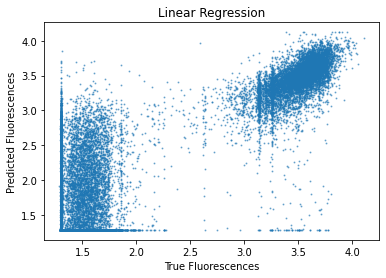

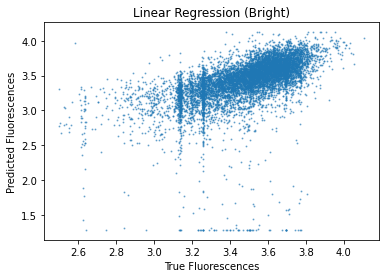

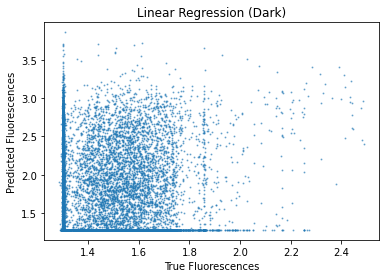

{'bright_mse': 0.088,
 'bright_spearmanr': 0.681,
 'dark_mse': 0.329,
 'dark_spearmanr': 0.052,
 'mse': 0.252,
 'spearmanr': 0.691,
 'title': 'Linear Regression'}


In [ ]:
gfp_linear_model_results, linear_model_pred_fluorescences = \
gfp_evaluate(predict_fn=None, 
             title='Linear Regression',
             pred_fluorescences=linear_model_pred_fluorescences,
             clip_min=min(train_fluorescences),
             clip_max=max(train_fluorescences))

### CNN + MaxPool

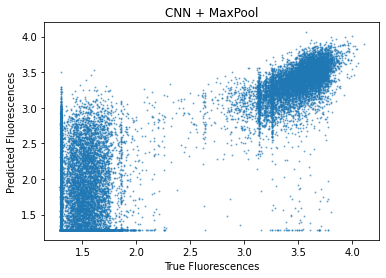

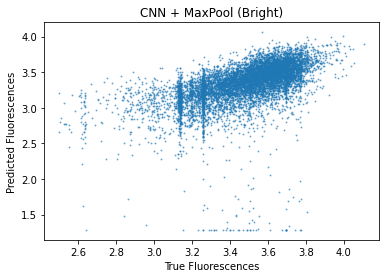

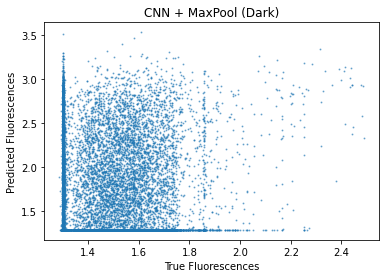

{'bright_mse': 0.092,
 'bright_spearmanr': 0.65,
 'dark_mse': 0.341,
 'dark_spearmanr': 0.051,
 'mse': 0.262,
 'spearmanr': 0.687,
 'title': 'CNN + MaxPool'}


In [ ]:
epochs = 50
gfp_train_batches, train_fluorescences = create_gfp_batches(batch_size=256, epochs=epochs)

layers = ['CNN_0', 'Dense_1']                                 
learning_rate = [1e-3, 5e-6]
weight_decay = [0.0, 0.05]

encoder_fn = cnn_one_hot_encoder
encoder_fn_kwargs = {
    'n_layers': 1,
    'n_features': [1024],
    'n_kernel_sizes': [5]
}
reduce_fn = max_pool
reduce_fn_kwargs = {

}
loss_fn_kwargs = {
    
}

gfp_model = create_representation_model(encoder_fn=encoder_fn,
                                        encoder_fn_kwargs=encoder_fn_kwargs,
                                        reduce_fn=reduce_fn,
                                        reduce_fn_kwargs=reduce_fn_kwargs,
                                        num_categories=len(GFP_AMINO_ACID_VOCABULARY),
                                        output_features=1)

gfp_optimizer = train(model=gfp_model,
                      train_data=gfp_train_batches, 
                      loss_fn=mse_loss,
                      loss_fn_kwargs=loss_fn_kwargs,
                      learning_rate=learning_rate, 
                      weight_decay=weight_decay,
                      layers=layers)

gfp_results, pred_fluorescences = gfp_evaluate(predict_fn=gfp_optimizer.target,
                                               title='CNN + MaxPool',
                                               batch_size=256,
                                               clip_min=min(train_fluorescences),
                                               clip_max=max(train_fluorescences))

### CNN + LinearMaxPool

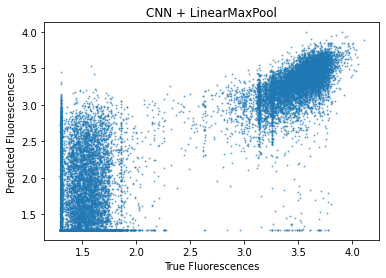

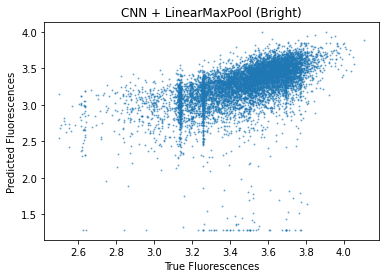

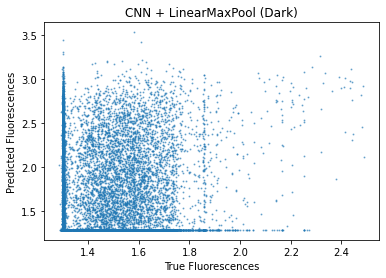

{'bright_mse': 0.115,
 'bright_spearmanr': 0.659,
 'dark_mse': 0.281,
 'dark_spearmanr': 0.053,
 'mse': 0.228,
 'spearmanr': 0.691,
 'title': 'CNN + LinearMaxPool'}


In [ ]:
epochs = 50
gfp_train_batches, train_fluorescences = create_gfp_batches(batch_size=256, epochs=epochs)

layers = ['CNN_0', 'Dense_1', 'Dense_2']                                 
learning_rate = [1e-3, 5e-5, 5e-6]
weight_decay = [0.0, 0.05, 0.05]

encoder_fn = cnn_one_hot_encoder
encoder_fn_kwargs = {
    'n_layers': 1,
    'n_features': [1024],
    'n_kernel_sizes': [5]
}
reduce_fn = linear_max_pool
reduce_fn_kwargs = {
    'rep_size': 2048
}
loss_fn_kwargs = {
    
}

gfp_model_l = create_representation_model(encoder_fn=encoder_fn,
                                          encoder_fn_kwargs=encoder_fn_kwargs,
                                          reduce_fn=reduce_fn,
                                          reduce_fn_kwargs=reduce_fn_kwargs,
                                          num_categories=len(GFP_AMINO_ACID_VOCABULARY),
                                          output_features=1)

gfp_optimizer_l = train(model=gfp_model_l,
                        train_data=gfp_train_batches, 
                        loss_fn=mse_loss,
                        loss_fn_kwargs=loss_fn_kwargs,
                        learning_rate=learning_rate, 
                        weight_decay=weight_decay,
                        layers=layers)

gfp_results_l, pred_fluorescences_l = gfp_evaluate(predict_fn=gfp_optimizer_l.target,
                                                   title='CNN + LinearMaxPool',
                                                   batch_size=256,
                                                   clip_min=min(train_fluorescences),
                                                   clip_max=max(train_fluorescences))

### TAPE (Best Performance)

In [ ]:
tape_fluorescence_results = {
    'title': 'TAPE',
    'spearmanr': 0.68,
    'mse': 0.19,
    'bright_spearmanr': 0.63,
    'bright_mse': 0.07,
    'dark_mse': 0.22,
    'dark_spearmanr': 0.05,
}

In [ ]:
pprint.pprint(tape_fluorescence_results)

{'bright_mse': 0.07,
 'bright_spearmanr': 0.63,
 'dark_mse': 0.22,
 'dark_spearmanr': 0.05,
 'mse': 0.19,
 'spearmanr': 0.68,
 'title': 'TAPE'}


## Visualization

In [ ]:
def gfp_embeddings(encoder_fn, encoder_fn_kwargs, reduce_fn, reduce_fn_kwargs, optimizer):
  """Computes GFP embeddings from given optimizer."""

  gfp_encoding_model = create_representation_model(encoder_fn=encoder_fn,
                                                   encoder_fn_kwargs=encoder_fn_kwargs,
                                                   reduce_fn=reduce_fn,
                                                   reduce_fn_kwargs=reduce_fn_kwargs,
                                                   num_categories=len(GFP_AMINO_ACID_VOCABULARY),
                                                   output='embedding',
                                                   output_features=1)
  
  trained_params = copy.deepcopy(optimizer.target.params)

  gfp_encoding_optimizer = create_optimizer(gfp_encoding_model,
                                            learning_rate=learning_rate,
                                            weight_decay=weight_decay,
                                            layers=layers)
  
  for layer in gfp_encoding_optimizer.target.params.keys():
    gfp_encoding_optimizer.target.params[layer] = trained_params[layer]

  gfp_train_batches, train_fluorescences = create_gfp_batches(batch_size=256, buffer_size=1)
  gfp_train_embeddings = compute_embeddings(gfp_encoding_optimizer.target, gfp_train_batches)
  
  gfp_test_batches, test_fluorescences = create_gfp_batches(batch_size=256, test=True)
  gfp_test_embeddings = compute_embeddings(gfp_encoding_optimizer.target, gfp_test_batches)

  return gfp_train_embeddings, gfp_test_embeddings

In [ ]:
# CNN + MaxPool Optimizer Embeddings
encoder_fn = cnn_one_hot_encoder
encoder_fn_kwargs = {
    'n_layers': 1,
    'n_features': [1024],
    'n_kernel_sizes': [5]
}
reduce_fn = max_pool
reduce_fn_kwargs = {
    
}
gfp_train_embeddings, gfp_test_embeddings = gfp_embeddings(encoder_fn, 
                                                           encoder_fn_kwargs,
                                                           reduce_fn,
                                                           reduce_fn_kwargs, 
                                                           gfp_optimizer)

In [ ]:
# Random CNN + MaxPool Optimizer Embeddings
layers = ['CNN_0', 'Dense_1']                                 
learning_rate = [1e-3, 5e-6]
weight_decay = [0.0, 0.05]

encoder_fn = cnn_one_hot_encoder
encoder_fn_kwargs = {
    'n_layers': 1,
    'n_features': [1024],
    'n_kernel_sizes': [5]
}
reduce_fn = max_pool
reduce_fn_kwargs = {

}
loss_fn_kwargs = {
    
}

gfp_model = create_representation_model(encoder_fn=encoder_fn,
                                        encoder_fn_kwargs=encoder_fn_kwargs,
                                        reduce_fn=reduce_fn,
                                        reduce_fn_kwargs=reduce_fn_kwargs,
                                        num_categories=len(GFP_AMINO_ACID_VOCABULARY),
                                        output_features=1)

gfp_optimizer_random = create_optimizer(gfp_model, learning_rate, weight_decay, layers)

gfp_train_embeddings_random, gfp_test_embeddings_random = gfp_embeddings(encoder_fn, 
                                                                         encoder_fn_kwargs,
                                                                         reduce_fn,
                                                                         reduce_fn_kwargs, 
                                                                         gfp_optimizer_random)

In [ ]:
# CNN + LinearMaxPool Optimizer Embeddings
encoder_fn = cnn_one_hot_encoder
encoder_fn_kwargs = {
    'n_layers': 1,
    'n_features': [1024],
    'n_kernel_sizes': [5]
}
reduce_fn = linear_max_pool
reduce_fn_kwargs = {
    'rep_size': 2048
}
gfp_train_embeddings_l, gfp_test_embeddings_l = gfp_embeddings(encoder_fn,
                                                               encoder_fn_kwargs,
                                                               reduce_fn,
                                                               reduce_fn_kwargs,
                                                               gfp_optimizer_l)

### Train PCA

In [ ]:
def gfp_train_pca_plot(train_embeddings, model_name):
  """Applies and plots PCA on GFP train embeddings."""

  gfp_train_embeddings_pca = PCA(n_components=2).fit_transform(train_embeddings)
  
  X_train = [g[0] for g in gfp_train_embeddings_pca]
  Y_train = [g[1] for g in gfp_train_embeddings_pca]

  gfp_train_df = create_gfp_df()

  plt.figure(figsize=(8, 6))
  plt.scatter(X_train, Y_train, c=gfp_train_df.log_fluorescence.values, s=1, alpha=0.5)
  plt.title('PCA of Train GFP Embeddings (' + model_name + ')')
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.colorbar().set_label('Fluorescence')
  plt.show()

  plt.figure(figsize=(8, 6))
  plt.scatter(X_train, Y_train, c=gfp_train_df.num_mutations.values, s=1, alpha=0.5)
  plt.title('PCA of Train GFP Embeddings( ' + model_name + ')')
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  cbar = plt.colorbar()
  cbar.set_label('Mutations (Edit Distance)')
  cbar.set_ticks(range(4))
  plt.show()

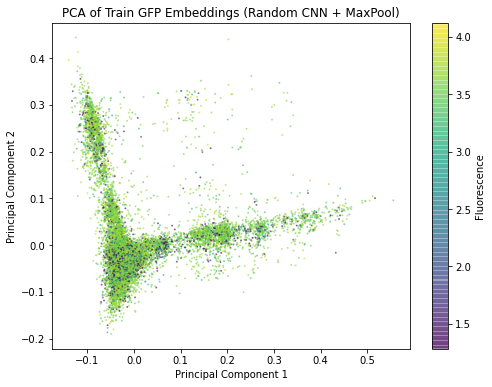

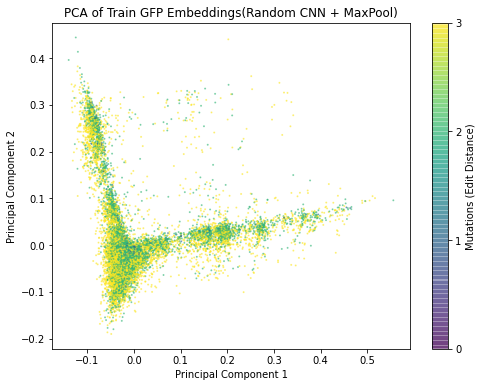

In [ ]:
gfp_train_pca_plot(gfp_train_embeddings_random, model_name='Random CNN + MaxPool')

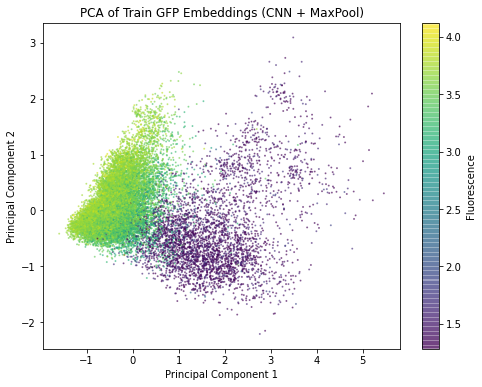

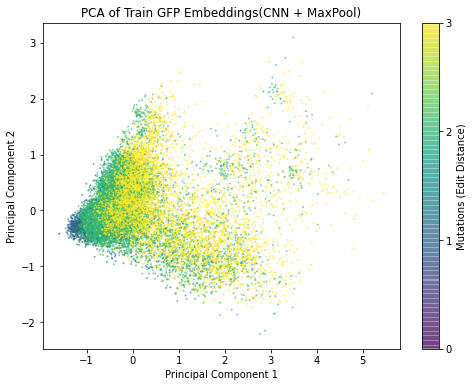

In [ ]:
gfp_train_pca_plot(gfp_train_embeddings, model_name='CNN + MaxPool')

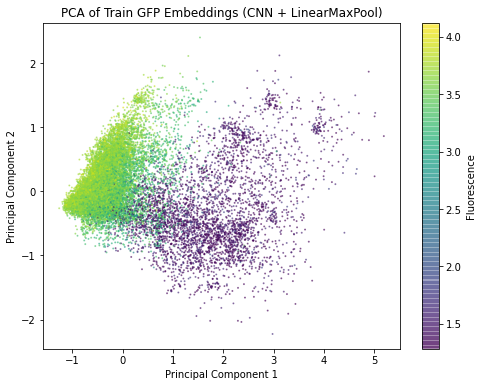

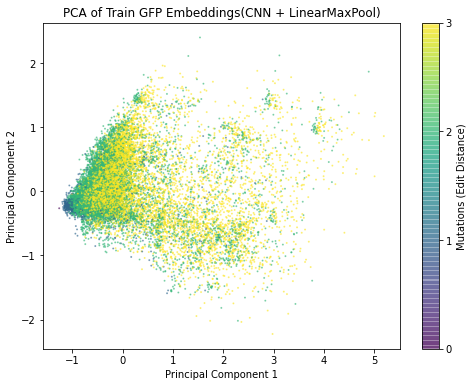

In [ ]:
gfp_train_pca_plot(gfp_train_embeddings_l, model_name='CNN + LinearMaxPool')

### Test PCA

In [ ]:
def gfp_test_pca_plot(test_embeddings, model_name, max_mut=8):
  """Applies and plots PCA on GFP test embeddings."""

  gfp_test_embeddings_pca = PCA(n_components=2).fit_transform(test_embeddings)
  
  X_test = [g[0] for g in gfp_test_embeddings_pca]
  Y_test = [g[1] for g in gfp_test_embeddings_pca]

  gfp_test_df = create_gfp_df(test=True)
  inds = [i for i in range(len(X_test)) if gfp_test_df.num_mutations.values[i]<=max_mut]

  X_test_mut_cap = [X_test[i] for i in inds]
  Y_test_mut_cap = [Y_test[i] for i in inds]
  mutations_mut_cap = [gfp_test_df.num_mutations.values[i] for i in inds]
  fluorescences_mut_cap = [gfp_test_df.log_fluorescence.values[i] for i in inds]

  plt.figure(figsize=(8, 6))
  plt.scatter(X_test_mut_cap, Y_test_mut_cap, c=fluorescences_mut_cap, s=1, alpha=0.25)
  plt.title('PCA of Test GFP Embeddings (' + model_name + ')')
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  cbar = plt.colorbar()
  cbar.set_label('Fluorescence')
  plt.show()

  plt.figure(figsize=(8, 6))
  plt.scatter(X_test_mut_cap, Y_test_mut_cap, c=mutations_mut_cap, s=1, alpha=0.25)
  plt.title('PCA of Test GFP Embeddings (' + model_name + ')')
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  cbar = plt.colorbar()
  cbar.set_label('Mutations (Edit Distance)')
  cbar.set_ticks(range(4, max_mut+1))
  plt.show()

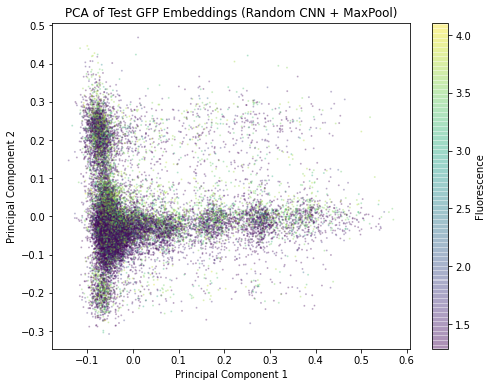

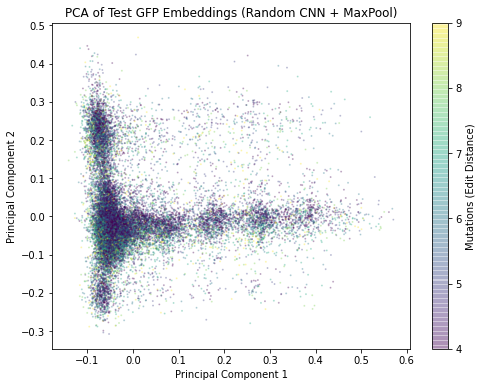

In [ ]:
gfp_test_pca_plot(gfp_test_embeddings_random, model_name='Random CNN + MaxPool', max_mut=9)

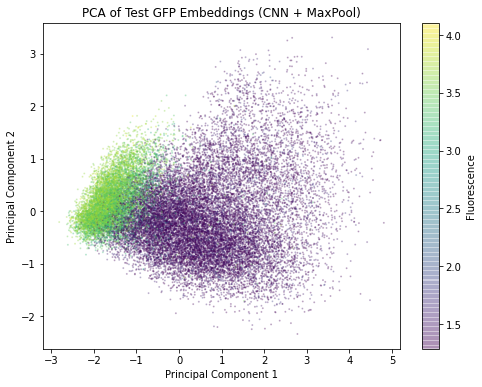

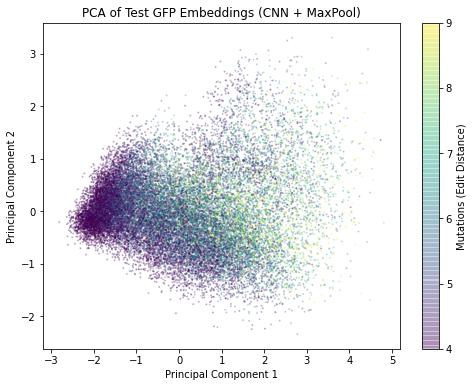

In [ ]:
gfp_test_pca_plot(gfp_test_embeddings, model_name='CNN + MaxPool', max_mut=9)

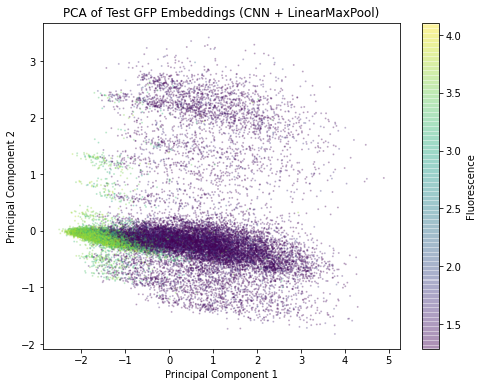

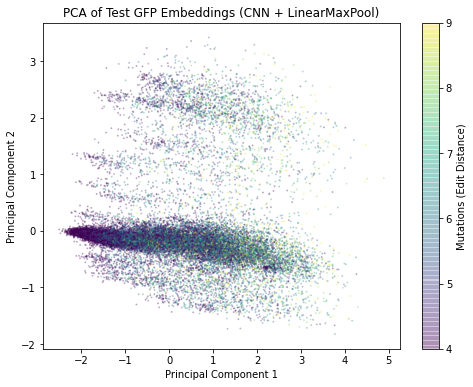

In [ ]:
gfp_test_pca_plot(gfp_test_embeddings_l, model_name='CNN + LinearMaxPool', max_mut=9)

### Train t-SNE

In [ ]:
def gfp_train_tsne_plot(train_embeddings, model_name, num_samples=2500):
  """Applies and plots t-SNE on GFP train embeddings."""

  gfp_train_df = create_gfp_df()

  np.random.seed(0)
  gfp_train_pairs = np.random.permutation(np.array([(train_embeddings[i], gfp_train_df.log_fluorescence.values[i], gfp_train_df.num_mutations.values[i]) for i in range(len(train_embeddings))]))
  sub_gfp_train_pairs = gfp_train_pairs[:num_samples]

  sub_gfp_train_embeddings = np.array([g[0] for g in sub_gfp_train_pairs])
  sub_gfp_train_fluorescences = np.array([g[1] for g in sub_gfp_train_pairs])
  sub_gfp_train_mutations = np.array([g[2] for g in sub_gfp_train_pairs])

  gfp_train_embeddings_tsne = TSNE(n_components=2).fit_transform(sub_gfp_train_embeddings)

  X_tsne_train = [g[0] for g in gfp_train_embeddings_tsne]
  Y_tsne_train = [g[1] for g in gfp_train_embeddings_tsne]

  plt.figure(figsize=(8, 6))
  plt.scatter(X_tsne_train, Y_tsne_train, c=sub_gfp_train_fluorescences, s=5, alpha=0.5)
  plt.title('t-SNE of Train GFP Embeddings (' + model_name + ')')
  cbar = plt.colorbar()
  cbar.set_label('Fluorescence')
  plt.show()

  plt.figure(figsize=(8, 6))
  plt.scatter(X_tsne_train, Y_tsne_train, c=sub_gfp_train_mutations, s=5, alpha=0.5)
  plt.title('t-SNE of Train GFP Embeddings (' + model_name + ')')
  cbar = plt.colorbar()
  cbar.set_label('Mutations (Edit Distance)')
  cbar.set_ticks(range(4))
  plt.show()

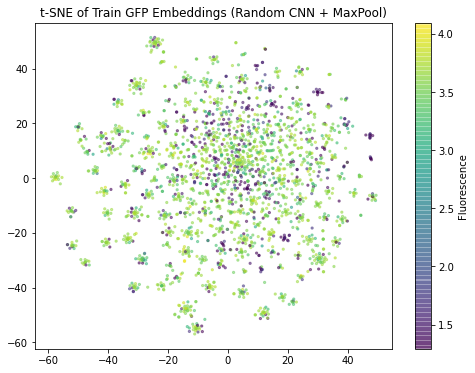

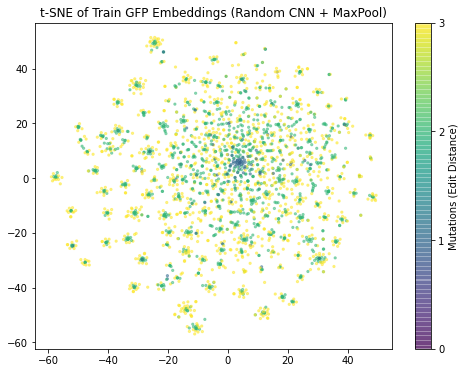

In [ ]:
gfp_train_tsne_plot(gfp_train_embeddings_random, model_name='Random CNN + MaxPool', num_samples=2500)

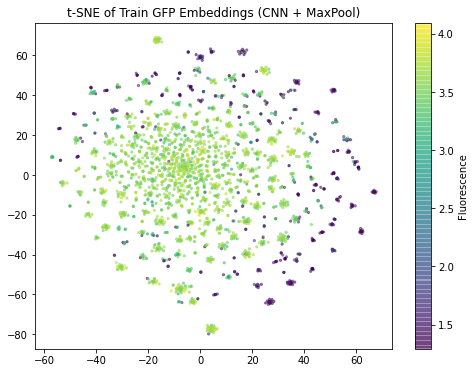

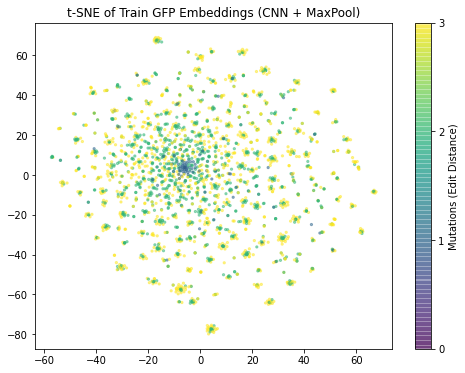

In [ ]:
gfp_train_tsne_plot(gfp_train_embeddings, model_name='CNN + MaxPool', num_samples=2500)

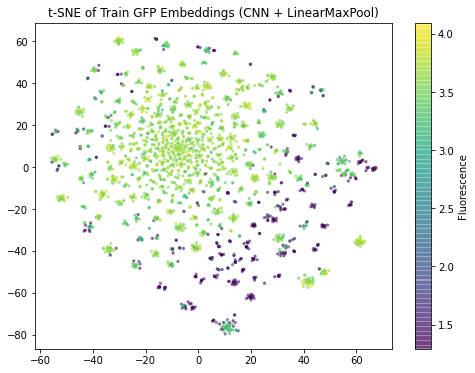

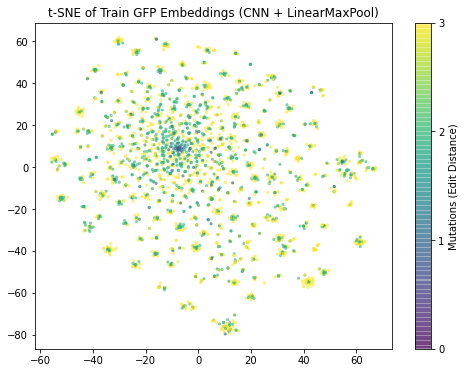

In [ ]:
gfp_train_tsne_plot(gfp_train_embeddings_l, model_name='CNN + LinearMaxPool', num_samples=2500)

### Test t-SNE

In [ ]:
def gfp_test_tsne_plot(test_embeddings, model_name, max_mut=8, num_samples=2500):
  """Applies and plots t-SNE on GFP test embeddings."""

  gfp_test_df = create_gfp_df(test=True)

  np.random.seed(0)
  gfp_test_pairs_mut_cap = np.random.permutation(np.array([(test_embeddings[i], gfp_test_df.log_fluorescence.values[i], gfp_test_df.num_mutations.values[i]) for i in range(len(test_embeddings)) if gfp_test_df.num_mutations.values[i]<=max_mut]))
  sub_gfp_test_pairs_mut_cap = gfp_test_pairs_mut_cap[:num_samples]

  sub_gfp_test_embeddings_mut_cap = np.array([g[0] for g in sub_gfp_test_pairs_mut_cap])
  sub_gfp_test_fluorescences_mut_cap = np.array([g[1] for g in sub_gfp_test_pairs_mut_cap])
  sub_gfp_test_mutations_mut_cap = np.array([g[2] for g in sub_gfp_test_pairs_mut_cap])

  gfp_test_embeddings_tsne_mut_cap = TSNE(n_components=2).fit_transform(sub_gfp_test_embeddings_mut_cap)

  X_tsne_test_mut_cap = [g[0] for g in gfp_test_embeddings_tsne_mut_cap]
  Y_tsne_test_mut_cap = [g[1] for g in gfp_test_embeddings_tsne_mut_cap]

  plt.figure(figsize=(8, 6))
  plt.scatter(X_tsne_test_mut_cap, Y_tsne_test_mut_cap, c=sub_gfp_test_fluorescences_mut_cap, s=5, alpha=0.5)
  plt.title('t-SNE of Test GFP Embeddings (' + model_name + ')')
  cbar = plt.colorbar()
  cbar.set_label('Fluorescence')
  plt.show()

  plt.figure(figsize=(8, 6))
  plt.scatter(X_tsne_test_mut_cap, Y_tsne_test_mut_cap, c=sub_gfp_test_mutations_mut_cap, s=5, alpha=0.5)
  plt.title('t-SNE of Test GFP Embeddings (' + model_name + ')')
  cbar = plt.colorbar()
  cbar.set_label('Mutations (Edit Distance)')
  cbar.set_ticks(range(4, max_mut+1))
  plt.show()

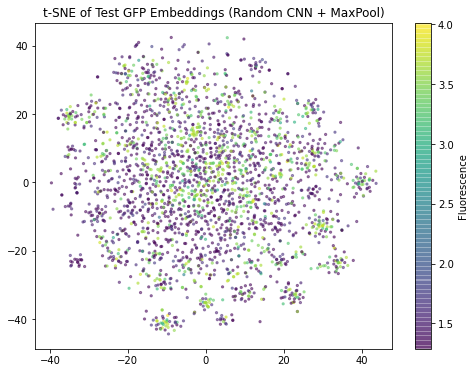

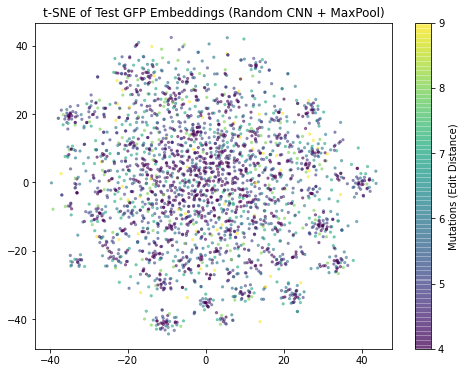

In [ ]:
gfp_test_tsne_plot(gfp_test_embeddings_random, model_name='Random CNN + MaxPool', max_mut=9, num_samples=2500)

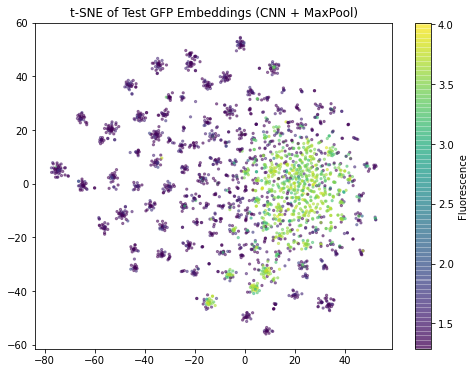

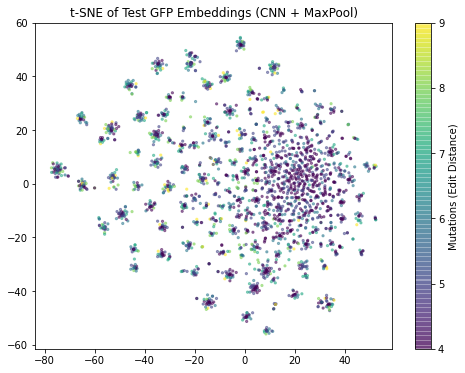

In [ ]:
gfp_test_tsne_plot(gfp_test_embeddings, model_name='CNN + MaxPool', max_mut=9, num_samples=2500)

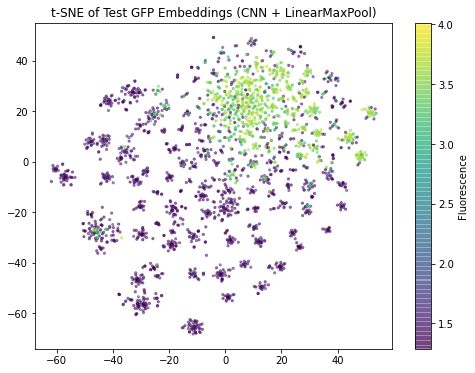

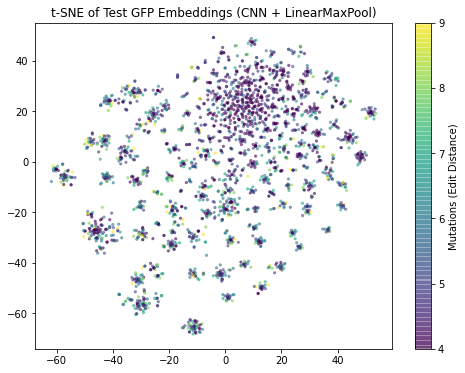

In [ ]:
gfp_test_tsne_plot(gfp_test_embeddings_l, model_name='CNN + LinearMaxPool', max_mut=9, num_samples=2500)

# Stability

## Open data

In [ ]:
!wget http://s3.amazonaws.com/proteindata/data_pytorch/stability.tar.gz

--2020-08-17 14:23:58--  http://s3.amazonaws.com/proteindata/data_pytorch/stability.tar.gz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.217.45.62
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.217.45.62|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3116829 (3.0M) [application/x-tar]
Saving to: ‘stability.tar.gz’

stability.tar.gz    100%[===================>]   2.97M  13.0MB/s    in 0.2s    

2020-08-17 14:23:58 (13.0 MB/s) - ‘stability.tar.gz’ saved [3116829/3116829]



In [ ]:
!tar xzf stability.tar.gz

In [ ]:
def stability_dataset_to_df(in_name):
  dataset = LMDBDataset(in_name)
  df = pd.DataFrame(list(dataset)[:])
  df['stability'] = df.stability_score.apply(lambda x: x[0])
  df['id_str'] = df.id.apply(lambda x: x.decode('utf-8'))
  return df

### Padding and one-hot encoding

In [ ]:
STABILITY_SEQ_LEN = 50
def stability_pad_seq(seq, pad_char='-'):
  
  for i in range(STABILITY_SEQ_LEN - len(seq)):
    seq += pad_char
    
  return seq

In [ ]:
STABILITY_AMINO_ACID_VOCABULARY = [
    'A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R',
    'S', 'T', 'V', 'W', 'Y', '-'
]

def stability_residues_to_one_hot_inds(amino_acid_residues):
  return np.array([STABILITY_AMINO_ACID_VOCABULARY.index(char) for char in amino_acid_residues])

### Add one-hots and batch data

In [ ]:
stability_train_df = stability_dataset_to_df('stability/stability_train.lmdb')
stability_test_df = stability_dataset_to_df('stability/stability_test.lmdb')

In [ ]:
parent_to_parent_stability = {}

In [ ]:
for parent in set(stability_train_df.parent.values): 
  stabilities = stability_train_df[stability_train_df['id_str']==parent.decode('utf-8') + '.pdb'].stability.values
  if len(stabilities) == 0:
    stabilities = stability_train_df[stability_train_df['id_str']==parent.decode('utf-8')].stability.values
    if len(stabilities) == 0:
      parent_to_parent_stability[parent] = None
    else:
      parent_to_parent_stability[parent] = stabilities[0]
  else:
    parent_to_parent_stability[parent] = stabilities[0]

In [ ]:
for parent in set(stability_test_df.parent.values): 
  stabilities = stability_test_df[stability_test_df['id_str']==parent.decode('utf-8') + '.pdb'].stability.values
  if len(stabilities) == 0:
    stabilities = stability_test_df[stability_test_df['id_str']==parent.decode('utf-8')].stability.values
    if len(stabilities) == 0:
      parent_to_parent_stability[parent] = None
    else:
      parent_to_parent_stability[parent] = stabilities[0]
  else:
    parent_to_parent_stability[parent] = stabilities[0]

In [ ]:
topology_to_ind = {'HHH': 0, 'HEEH': 1, 'EHEE': 3, 'EEHEE': 4}
def topology_to_index(top):
  """Returns categorical variable corresponding to a topology."""
  
  top = top.decode('utf-8')
  if top in topology_to_ind.keys():
    return topology_to_ind[top]
  else:
    return 2

In [ ]:
def create_stability_df(test=False):
  """Processes stability data into a featurized dataframe."""
  
  if test:
    stability_df = stability_dataset_to_df('stability/stability_test.lmdb')
  else:
    stability_df = stability_dataset_to_df('stability/stability_train.lmdb')
  
  stability_df['one_hot_inds'] = stability_df.primary.apply(lambda x: stability_residues_to_one_hot_inds(stability_pad_seq(x[:50])))

  stability_df['parent_stability'] = stability_df.parent.apply(lambda x: parent_to_parent_stability[x])

  stability_df['topology_ind'] = stability_df.topology.apply(lambda x: topology_to_index(x))

  return stability_df


def create_stability_batches(batch_size, epochs=1, test=False, buffer_size=None, seed=0, drop_remainder=False):
  """Creates iterable object of Stability batches."""
  
  if test:
    buffer_size = 1
  
  stability_df = create_stability_df(test=test)
    
  stabilities = stability_df['stability'].values

  stability_batches = create_data_iterator(df=stability_df, input_col='one_hot_inds', output_col='stability',
                                           batch_size=batch_size, epochs=epochs, buffer_size=buffer_size, 
                                           seed=seed, drop_remainder=drop_remainder)

  return stability_batches, stabilities

## Model evaluation

In [ ]:
def stability_evaluate(predict_fn, title, batch_size=256, 
                       test_data=None, pred_stabilities=None,
                       clip_min=-999999, clip_max=999999):
  """Computes predicted stabilities and measures performance in spearman correlation."""
  
  test_batches, test_stabilities = create_stability_batches(batch_size=batch_size, test=True, buffer_size=1)
  
  if test_data is not None:
    test_batches = test_data

  if pred_stabilities is None:
    pred_stabilities = []
    for batch in iter(test_batches):
      X, Y = batch
      preds = predict_fn(X)
      for pred in preds:
        pred_stabilities.append(pred[0])
  
  pred_stabilities = np.array(pred_stabilities)
  pred_stabilities = np.clip(pred_stabilities, clip_min, clip_max)
    
  spearmanr = scipy.stats.spearmanr(test_stabilities, pred_stabilities).correlation
  plt.scatter(test_stabilities, pred_stabilities, s=1, alpha=0.5)
  plt.xlabel('True Stabilities')
  plt.ylabel('Predicted Stabilities')
  plt.title(title)
  plt.show()
  
  stability_test_df = create_stability_df(test=True)
  stability_test_df['pred_stability'] = pred_stabilities
  stability_test_df['topology_str'] = stability_test_df.topology.apply(lambda x: x.decode('utf-8'))

  parent_to_pred_parent_stability = {}
  for parent in set(stability_test_df.parent.values): 
    pred_parent_stabilities = stability_test_df[stability_test_df['id_str']==parent.decode('utf-8') + '.pdb'].pred_stability.values
    if len(pred_parent_stabilities) == 0:
      pred_parent_stabilities = stability_test_df[stability_test_df['id_str']==parent.decode('utf-8')].pred_stability.values
      if len(pred_parent_stabilities) == 0:
        parent_to_pred_parent_stability[parent] = None
      else:
        parent_to_pred_parent_stability[parent] = pred_parent_stabilities[0]
    else:
      parent_to_pred_parent_stability[parent] = pred_parent_stabilities[0]
  
  stability_test_df['pred_parent_stability'] = stability_test_df.parent.apply(lambda x: parent_to_pred_parent_stability[x])
  
  parent_stabilities = stability_test_df['parent_stability'].values
  pred_parent_stabilities = stability_test_df['pred_parent_stability'].values

  correct_direction = 0
  for test_stability, pred_stability, parent_stability, pred_parent_stability in zip(test_stabilities, pred_stabilities, parent_stabilities, pred_parent_stabilities):
    if parent_stability is not None:
      if (test_stability >= parent_stability and pred_stability >= pred_parent_stability) or (test_stability <= parent_stability and pred_stability <= pred_parent_stability):
        correct_direction += 1
  accuracy = correct_direction / len(np.where(parent_stabilities!=None)[0])
  
  topologies = [('EEHEE', 'BBABB'), ('EHEE', 'BABB'), ('HEEH', 'ABBA'), ('HHH', 'AAA')]
  topology_results = {}
  
  for topology_pair in topologies:
    topology, topology_name = topology_pair
    topology_test_df = stability_test_df[stability_test_df['topology_str']==topology]

    topology_test_stabilities = topology_test_df['stability'].values
    topology_pred_stabilities = topology_test_df['pred_stability'].values
      
    topology_spearmanr = scipy.stats.spearmanr(topology_test_stabilities, topology_pred_stabilities).correlation
    plt.scatter(topology_test_stabilities, topology_pred_stabilities, s=1, alpha=0.5)
    plt.xlabel('True Stabilities')
    plt.ylabel('Predicted Stabilities')
    plt.title(title + ' (' + topology_name + ')')
    plt.show()
    
    topology_parent_stabilities = topology_test_df['parent_stability'].values
    topology_pred_parent_stabilities = topology_test_df['pred_parent_stability'].values

    topology_correct_direction = 0
    for test_stability, pred_stability, parent_stability, pred_parent_stability in zip(topology_test_stabilities, topology_pred_stabilities, topology_parent_stabilities, topology_pred_parent_stabilities):
      if parent_stability is not None:
        if (test_stability >= parent_stability and pred_stability >= pred_parent_stability) or (test_stability <= parent_stability and pred_stability <= pred_parent_stability):
          topology_correct_direction += 1
    topology_accuracy = topology_correct_direction / len(np.where(topology_parent_stabilities!=None)[0])
    
    topology_results[topology_name] = (topology_spearmanr, topology_accuracy)

  results = {
      'title': title,
      'spearmanr': round(spearmanr, 3),
      'accuracy': round(accuracy, 3)
  }
  for topology_name in topology_results.keys():
    results[topology_name + '_spearmanr'] = round(topology_results[topology_name][0], 3)
    results[topology_name + '_accuracy'] = round(topology_results[topology_name][1], 3)
  
  pprint.pprint(results)

  return results, pred_stabilities

## Experiments

### Linear regression

In [ ]:
stability_train_df = create_stability_df()
train_stabilities = stability_train_df['stability']
stability_train_one_hot_inds = np.array([x for x in stability_train_df['one_hot_inds'].values])
stability_train_one_hots = flattened_one_hot_encoder(stability_train_one_hot_inds, num_categories=len(STABILITY_AMINO_ACID_VOCABULARY))

In [ ]:
stability_test_df = create_stability_df(test=True)
stability_test_one_hot_inds = np.array([x for x in stability_test_df['one_hot_inds'].values])
stability_test_one_hots = flattened_one_hot_encoder(stability_test_one_hot_inds, num_categories=len(STABILITY_AMINO_ACID_VOCABULARY))

In [ ]:
stability_linear_model = sklearn.linear_model.Ridge()
stability_linear_model.fit(X=stability_train_one_hots, y=stability_train_df['stability'])

Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [ ]:
linear_model_pred_stabilities = stability_linear_model.predict(stability_test_one_hots)

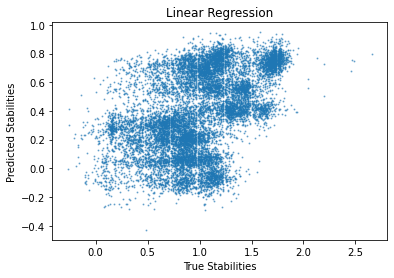

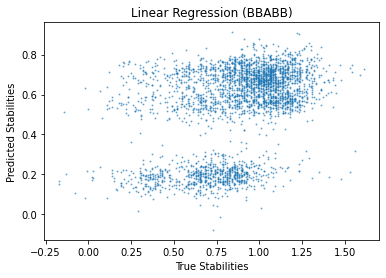

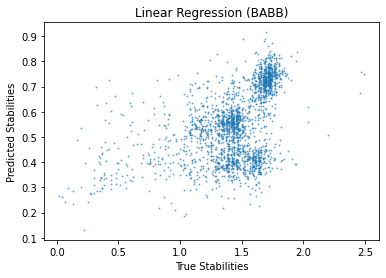

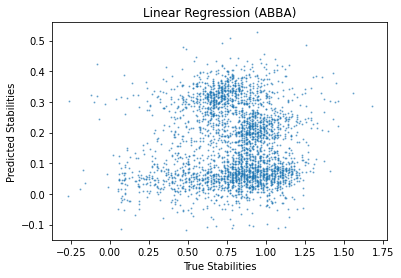

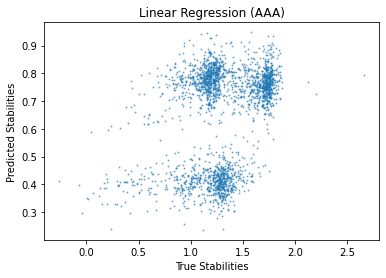

{'AAA_accuracy': 0.658,
 'AAA_spearmanr': 0.213,
 'ABBA_accuracy': 0.597,
 'ABBA_spearmanr': -0.028,
 'BABB_accuracy': 0.641,
 'BABB_spearmanr': 0.514,
 'BBABB_accuracy': 0.611,
 'BBABB_spearmanr': 0.381,
 'accuracy': 0.687,
 'spearmanr': 0.493,
 'title': 'Linear Regression'}


In [ ]:
stability_linear_model_results, linear_model_pred_stabilities = \
stability_evaluate(predict_fn=None, 
                   title='Linear Regression',
                   pred_stabilities=linear_model_pred_stabilities,
                   clip_min=min(train_stabilities),
                   clip_max=max(train_stabilities))

### CNN + MaxPool

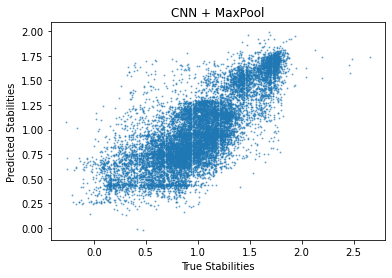

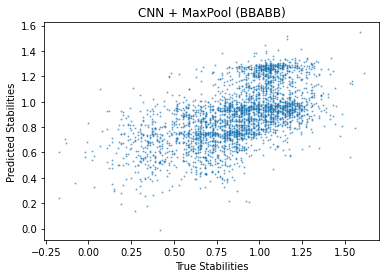

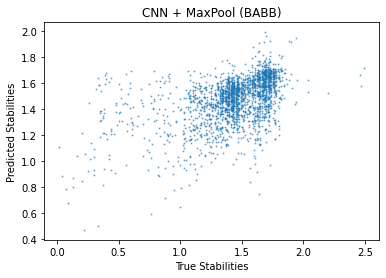

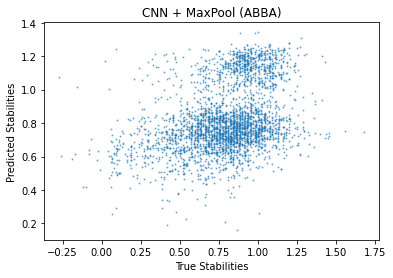

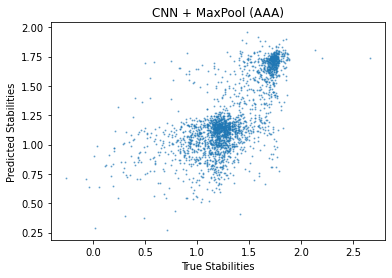

{'AAA_accuracy': 0.708,
 'AAA_spearmanr': 0.688,
 'ABBA_accuracy': 0.703,
 'ABBA_spearmanr': 0.37,
 'BABB_accuracy': 0.722,
 'BABB_spearmanr': 0.5,
 'BBABB_accuracy': 0.678,
 'BBABB_spearmanr': 0.598,
 'accuracy': 0.751,
 'spearmanr': 0.761,
 'title': 'CNN + MaxPool'}


In [ ]:
epochs = 5
stability_train_batches, train_stabilities = create_stability_batches(batch_size=16, epochs=epochs)

layers = ['CNN_0', 'Dense_1']                                 
learning_rate = [5e-4, 5e-5]
weight_decay = [0.025, 0.025]

encoder_fn = cnn_one_hot_encoder
encoder_fn_kwargs = {
    'n_layers': 3,
    'n_features': [1024, 1024, 1024],
    'n_kernel_sizes': [5, 5, 5]
}
reduce_fn = max_pool
reduce_fn_kwargs = {
    
}
loss_fn_kwargs = {
    
}

stability_model = create_representation_model(encoder_fn=encoder_fn,
                                              encoder_fn_kwargs=encoder_fn_kwargs,
                                              reduce_fn=reduce_fn,
                                              reduce_fn_kwargs=reduce_fn_kwargs,
                                              num_categories=len(STABILITY_AMINO_ACID_VOCABULARY),
                                              output_features=1)

stability_optimizer = train(model=stability_model,
                            train_data=stability_train_batches, 
                            loss_fn=mse_loss,
                            loss_fn_kwargs=loss_fn_kwargs,
                            learning_rate=learning_rate, 
                            weight_decay=weight_decay,
                            layers=layers)

stability_results, pred_stabilities = stability_evaluate(predict_fn=stability_optimizer.target,
                                                         title='CNN + MaxPool',
                                                         batch_size=1024,
                                                         clip_min=min(train_stabilities),
                                                         clip_max=max(train_stabilities))

### CNN + LinearMaxPool

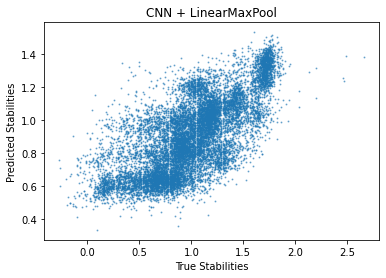

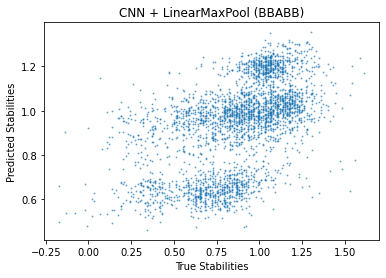

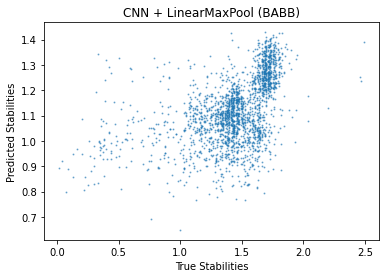

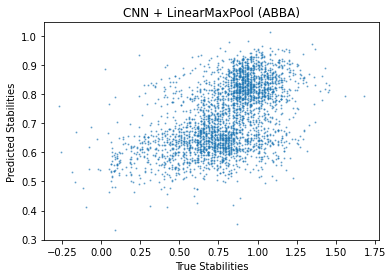

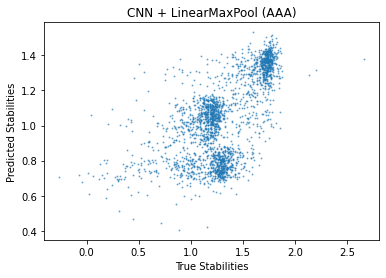

{'AAA_accuracy': 0.692,
 'AAA_spearmanr': 0.587,
 'ABBA_accuracy': 0.77,
 'ABBA_spearmanr': 0.519,
 'BABB_accuracy': 0.729,
 'BABB_spearmanr': 0.547,
 'BBABB_accuracy': 0.704,
 'BBABB_spearmanr': 0.567,
 'accuracy': 0.772,
 'spearmanr': 0.708,
 'title': 'CNN + LinearMaxPool'}


In [ ]:
epochs = 10
stability_train_batches, train_stabilities = create_stability_batches(batch_size=256, epochs=epochs)

layers = ['CNN_0', 'Dense_1', 'Dense_2']  
                              
learning_rate = [1e-5, 5e-5, 5e-6]
weight_decay = [0.0, 0.0, 0.0]

encoder_fn = cnn_one_hot_encoder
encoder_fn_kwargs = {
    'n_layers': 3,
    'n_features': [1024, 1024, 1024],
    'n_kernel_sizes': [5, 5, 5]
}
reduce_fn = linear_max_pool
reduce_fn_kwargs = {
    'rep_size': 2048
}
loss_fn_kwargs = {
    
}

stability_model_l = create_representation_model(encoder_fn=encoder_fn,
                                                encoder_fn_kwargs=encoder_fn_kwargs,
                                                reduce_fn=reduce_fn,
                                                reduce_fn_kwargs=reduce_fn_kwargs,
                                                num_categories=len(STABILITY_AMINO_ACID_VOCABULARY),
                                                output_features=1)

stability_optimizer_l = train(model=stability_model_l,
                              train_data=stability_train_batches, 
                              loss_fn=mse_loss,
                              loss_fn_kwargs=loss_fn_kwargs,
                              learning_rate=learning_rate, 
                              weight_decay=weight_decay,
                              layers=layers)

stability_results_l, pred_stabilities_l = stability_evaluate(predict_fn=stability_optimizer_l.target,
                                                             title='CNN + LinearMaxPool',
                                                             batch_size=1024,
                                                             clip_min=min(train_stabilities),
                                                             clip_max=max(train_stabilities))

### Ensemble of CNNs

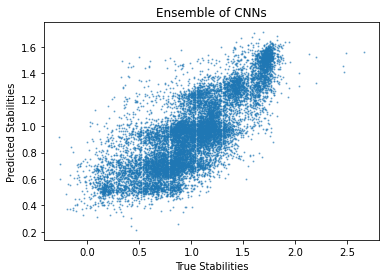

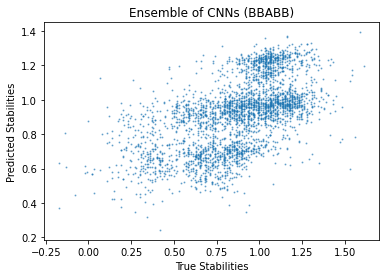

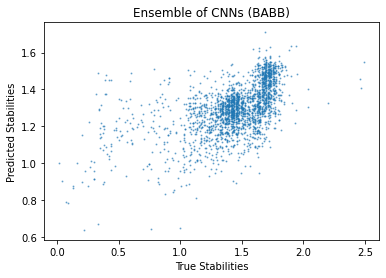

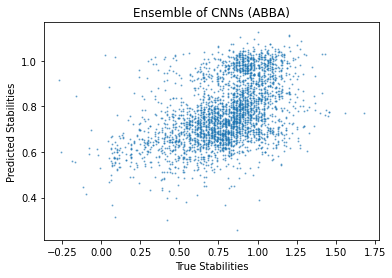

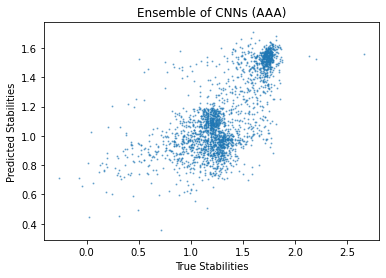

{'AAA_accuracy': 0.709,
 'AAA_spearmanr': 0.648,
 'ABBA_accuracy': 0.752,
 'ABBA_spearmanr': 0.491,
 'BABB_accuracy': 0.732,
 'BABB_spearmanr': 0.579,
 'BBABB_accuracy': 0.7,
 'BBABB_spearmanr': 0.603,
 'accuracy': 0.77,
 'spearmanr': 0.775,
 'title': 'Ensemble of CNNs'}


In [ ]:
ensemble_pred_stabilities = [(pred_stabilities[i]+pred_stabilities_l[i])/2 for i in range(len(pred_stabilities))]
ensemble_results, ensemble_pred_stabilities = stability_evaluate(predict_fn=None, 
                                                                 title='Ensemble of CNNs',
                                                                 pred_stabilities=ensemble_pred_stabilities,
                                                                 clip_min=min(train_stabilities),
                                                                 clip_max=max(train_stabilities))

### TAPE (Best Performance)

In [ ]:
tape_stability_results = {
    'title': 'TAPE',
    'spearmanr': 0.73,
    'accuracy': 0.70,
    'AAA_spearmanr': 0.72,
    'AAA_accuracy': 0.70,
    'ABBA_spearmanr': 0.48,
    'ABBA_accuracy': 0.79,
    'BABB_spearmanr': 0.68,
    'BABB_accuracy': 0.71,
    'BBABB_spearmanr': 0.67,
    'BBABB_accuracy': 0.70
}

In [ ]:
pprint.pprint(tape_stability_results)

{'AAA_accuracy': 0.7,
 'AAA_spearmanr': 0.72,
 'ABBA_accuracy': 0.79,
 'ABBA_spearmanr': 0.48,
 'BABB_accuracy': 0.71,
 'BABB_spearmanr': 0.68,
 'BBABB_accuracy': 0.7,
 'BBABB_spearmanr': 0.67,
 'accuracy': 0.7,
 'spearmanr': 0.73,
 'title': 'TAPE'}


## Visualization

In [ ]:
def stability_embeddings(encoder_fn, encoder_fn_kwargs, reduce_fn, reduce_fn_kwargs, optimizer):
  """Computes stability embeddings from given optimizer."""

  stability_encoding_model = create_representation_model(encoder_fn=encoder_fn,
                                                         encoder_fn_kwargs=encoder_fn_kwargs,
                                                         reduce_fn=reduce_fn,
                                                         reduce_fn_kwargs=reduce_fn_kwargs,
                                                         num_categories=len(STABILITY_AMINO_ACID_VOCABULARY),
                                                         output='embedding',
                                                         output_features=1)
  
  trained_params = copy.deepcopy(optimizer.target.params)

  stability_encoding_optimizer = create_optimizer(stability_encoding_model,
                                                  learning_rate=learning_rate,
                                                  weight_decay=weight_decay,
                                                  layers=layers)
  
  for layer in stability_encoding_optimizer.target.params.keys():
    stability_encoding_optimizer.target.params[layer] = trained_params[layer]

  stability_train_batches, train_stabilities = create_stability_batches(batch_size=256, buffer_size=1)
  stability_train_embeddings = compute_embeddings(stability_encoding_optimizer.target, stability_train_batches)
  
  stability_test_batches, test_stabilities = create_stability_batches(batch_size=256, test=True)
  stability_test_embeddings = compute_embeddings(stability_encoding_optimizer.target, stability_test_batches)

  return stability_train_embeddings, stability_test_embeddings

In [ ]:
# CNN + MaxPool Optimizer Embeddings
encoder_fn = cnn_one_hot_encoder
encoder_fn_kwargs = {
    'n_layers': 1,
    'n_features': [1024],
    'n_kernel_sizes': [5]
}
reduce_fn = max_pool
reduce_fn_kwargs = {

}
stability_train_embeddings, stability_test_embeddings = stability_embeddings(encoder_fn,
                                                                             encoder_fn_kwargs,
                                                                             reduce_fn,
                                                                             reduce_fn_kwargs,
                                                                             stability_optimizer)

In [ ]:
# Random CNN + MaxPool Optimizer Embeddings
layers = ['CNN_0', 'Dense_1']                                 
learning_rate = [5e-4, 5e-5]
weight_decay = [0.025, 0.025]

encoder_fn = cnn_one_hot_encoder
encoder_fn_kwargs = {
    'n_layers': 3,
    'n_features': [1024, 1024, 1024],
    'n_kernel_sizes': [5, 5, 5]
}
reduce_fn = max_pool
reduce_fn_kwargs = {
    
}
loss_fn_kwargs = {
    
}

stability_model = create_representation_model(encoder_fn=encoder_fn,
                                              encoder_fn_kwargs=encoder_fn_kwargs,
                                              reduce_fn=reduce_fn,
                                              reduce_fn_kwargs=reduce_fn_kwargs,
                                              num_categories=len(STABILITY_AMINO_ACID_VOCABULARY),
                                              output_features=1)

stability_optimizer_random = create_optimizer(stability_model, learning_rate, weight_decay, layers)

encoder_fn = cnn_one_hot_encoder
encoder_fn_kwargs = {
    'n_layers': 1,
    'n_features': [1024],
    'n_kernel_sizes': [5]
}
reduce_fn = max_pool
reduce_fn_kwargs = {

}
stability_train_embeddings_random, stability_test_embeddings_random = stability_embeddings(encoder_fn,
                                                                                           encoder_fn_kwargs,
                                                                                           reduce_fn,
                                                                                           reduce_fn_kwargs,
                                                                                           stability_optimizer_random)

In [ ]:
# CNN + LinearMaxPool Optimizer Embeddings
encoder_fn = cnn_one_hot_encoder
encoder_fn_kwargs = {
    'n_layers': 1,
    'n_features': [1024],
    'n_kernel_sizes': [5]
}
reduce_fn = linear_max_pool
reduce_fn_kwargs = {
    'rep_size': 2048
}
stability_train_embeddings_l, stability_test_embeddings_l = stability_embeddings(encoder_fn,
                                                                                 encoder_fn_kwargs,
                                                                                 reduce_fn,
                                                                                 reduce_fn_kwargs,
                                                                                 stability_optimizer_l)

In [ ]:
# Ensemble Embeddings (Concatention of Above Embeddings)
stability_train_embeddings_e = np.concatenate((stability_train_embeddings, stability_train_embeddings_l), axis=1)
stability_test_embeddings_e = np.concatenate((stability_test_embeddings, stability_test_embeddings_l), axis=1)

### Train PCA

In [ ]:
def stability_train_pca_plot(train_embeddings, model_name):
  """Applies and plots PCA on stability train embeddings."""

  stability_train_df = create_stability_df()

  stability_train_embeddings_pca = PCA(n_components=2).fit_transform(train_embeddings)
  
  X_train = [s[0] for s in stability_train_embeddings_pca]
  Y_train = [s[1] for s in stability_train_embeddings_pca]

  plt.figure(figsize=(8, 6))
  plt.scatter(X_train, Y_train, c=stability_train_df.stability.values, s=1, alpha=0.25)
  plt.title('PCA of Train Stability Embeddings (' + model_name + ')')
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.colorbar().set_label('Stability')
  plt.show()

  plt.figure(figsize=(8, 6))
  plt.scatter(X_train, Y_train, c=stability_train_df.parent_stability.values, s=1, alpha=0.5)
  plt.title('PCA of Train Stability Embeddings (' + model_name + ')')
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.colorbar().set_label('Parent Stability')
  plt.show()

  plt.figure(figsize=(8, 6))
  plt.scatter(X_train, Y_train, c=stability_train_df.topology_ind.values, s=1, alpha=0.5)
  plt.title('PCA of Train Stability Embeddings (' + model_name + ')')
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  
  topology_names = ['AAA', 'ABBA', 'Other', 'BABB', 'BBABB']
  formatter = plt.FuncFormatter(lambda val, loc: topology_names[val])
  cbar = plt.colorbar(ticks=range(5), format=formatter)
  cbar.set_label('Topology')
  plt.show()

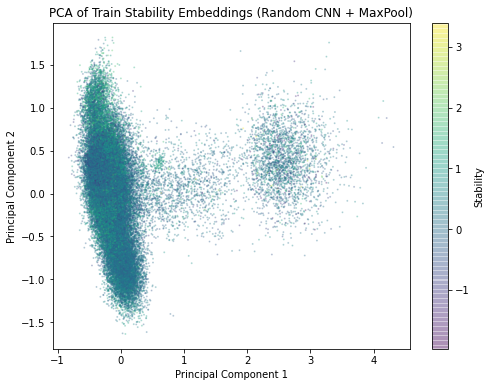

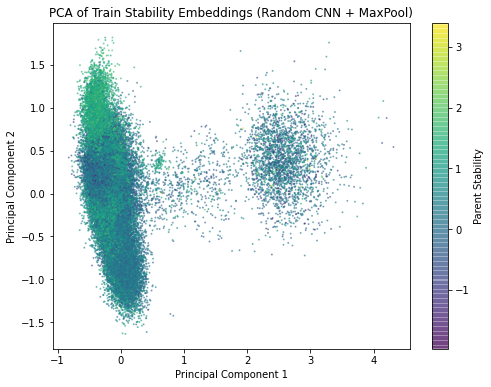

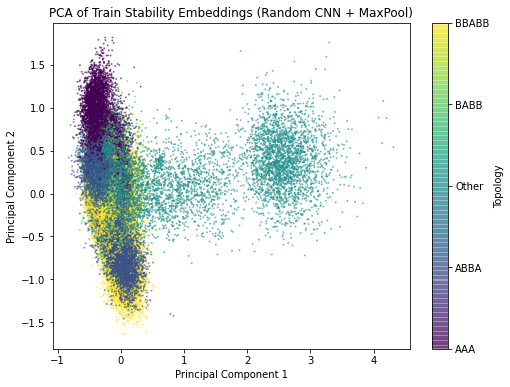

In [ ]:
stability_train_pca_plot(stability_train_embeddings_random, model_name='Random CNN + MaxPool')

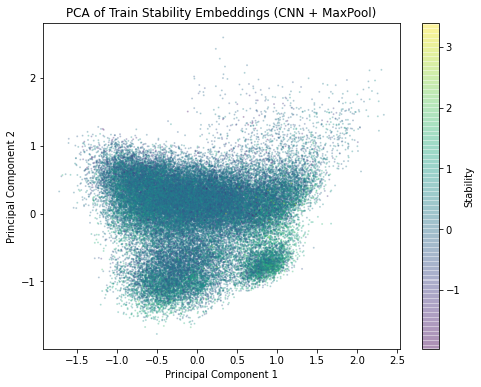

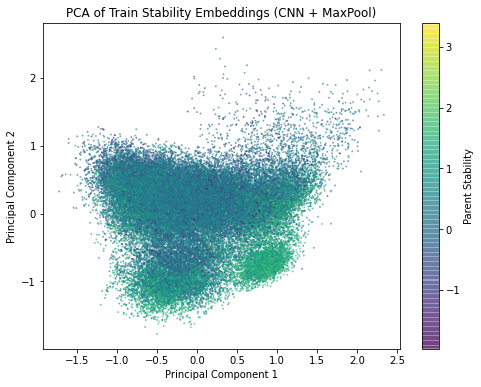

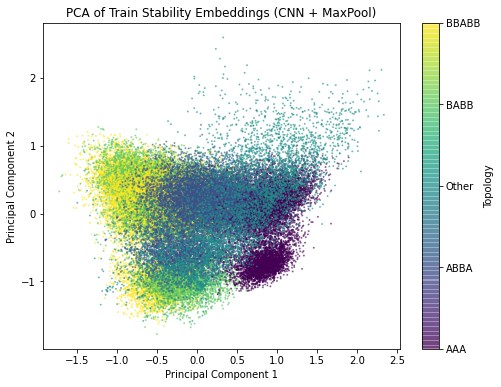

In [ ]:
stability_train_pca_plot(stability_train_embeddings, model_name='CNN + MaxPool')

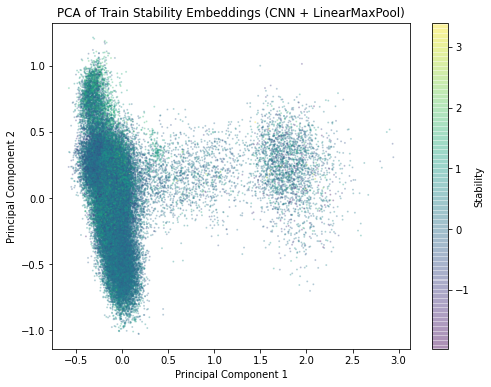

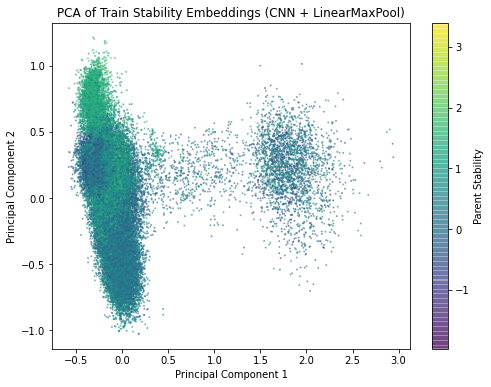

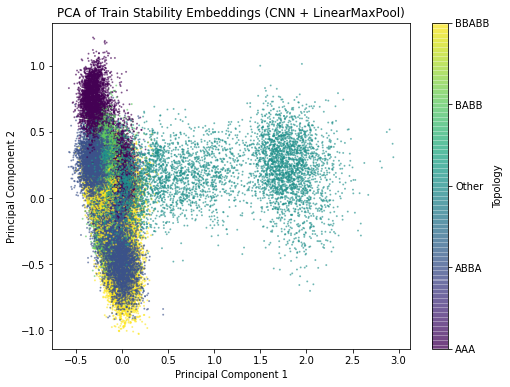

In [ ]:
stability_train_pca_plot(stability_train_embeddings_l, model_name='CNN + LinearMaxPool')

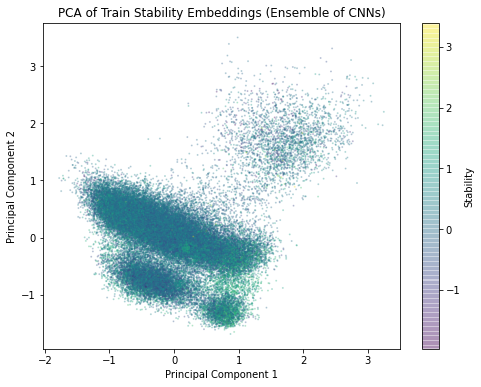

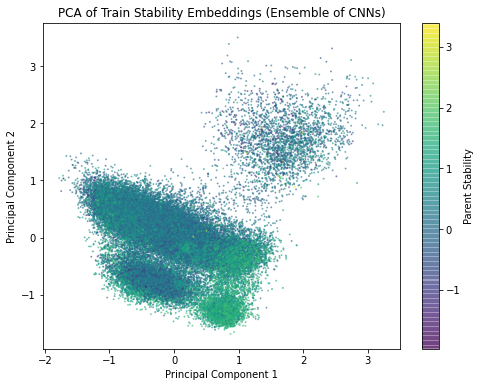

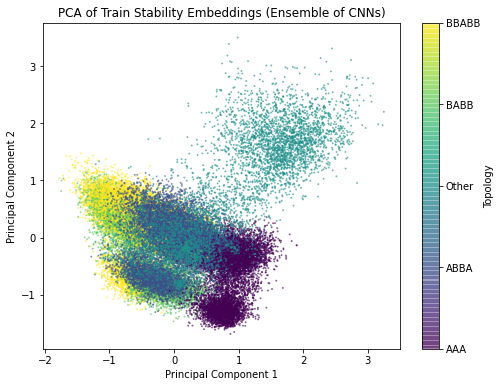

In [ ]:
stability_train_pca_plot(stability_train_embeddings_e, model_name='Ensemble of CNNs')

### Test PCA

In [ ]:
def stability_test_pca_plot(test_embeddings, model_name):
  """Applies and plots PCA on stability test embeddings."""

  stability_test_df = create_stability_df(test=True)

  stability_test_embeddings_pca = PCA(n_components=2).fit_transform(test_embeddings)
  
  X_test = [s[0] for s in stability_test_embeddings_pca]
  Y_test = [s[1] for s in stability_test_embeddings_pca]

  plt.figure(figsize=(8, 6))
  plt.scatter(X_test, Y_test, c=stability_test_df.stability.values, s=1, alpha=0.25)
  plt.title('PCA of Test Stability Embeddings (' + model_name + ')')
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.colorbar().set_label('Stability')
  plt.show()

  plt.figure(figsize=(8, 6))
  plt.scatter(X_test, Y_test, c=stability_test_df.parent_stability.values, s=1, alpha=0.5)
  plt.title('PCA of Test Stability Embeddings (' + model_name + ')')
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.colorbar().set_label('Parent Stability')
  plt.show()

  plt.figure(figsize=(8, 6))
  plt.scatter(X_test, Y_test, c=stability_test_df.topology_ind.values, s=1, alpha=0.5)
  plt.title('PCA of Test Stability Embeddings (' + model_name + ')')
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  topology_names = ['AAA', 'ABBA', 'Other', 'BABB', 'BBABB']
  formatter = plt.FuncFormatter(lambda val, loc: topology_names[val])
  cbar = plt.colorbar(ticks=range(5), format=formatter)
  cbar.set_label('Topology')
  plt.show()

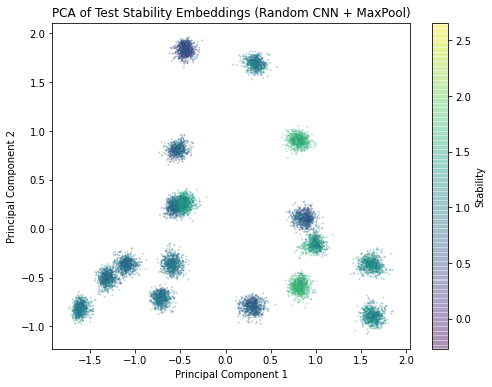

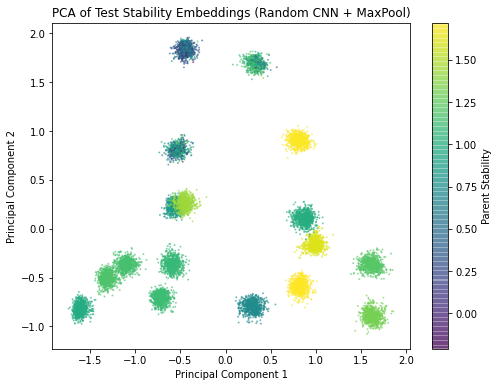

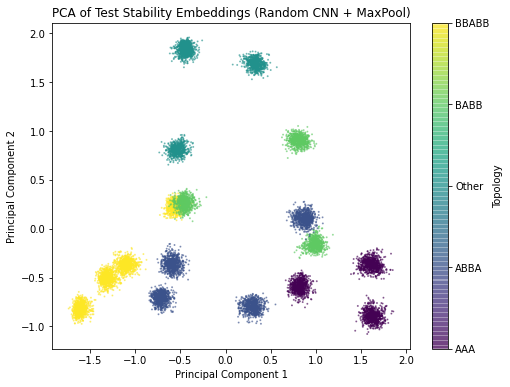

In [ ]:
stability_test_pca_plot(stability_test_embeddings_random, model_name='Random CNN + MaxPool')

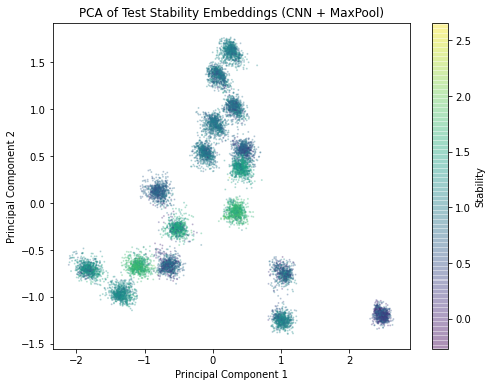

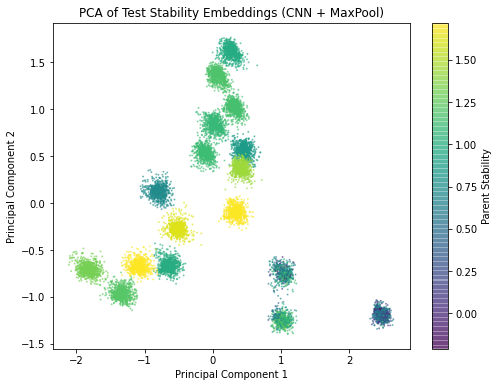

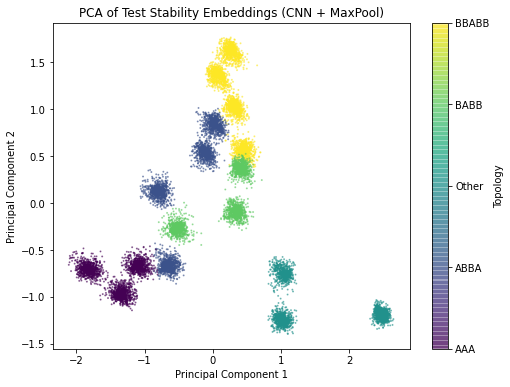

In [ ]:

stability_test_pca_plot(stability_test_embeddings, model_name='CNN + MaxPool')

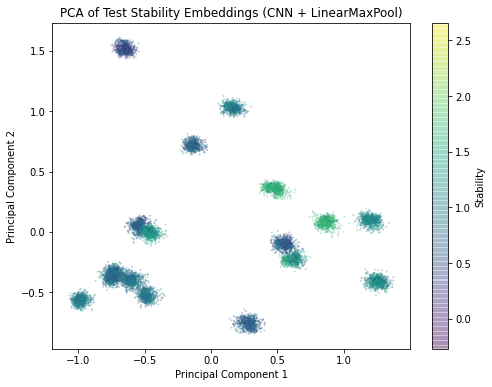

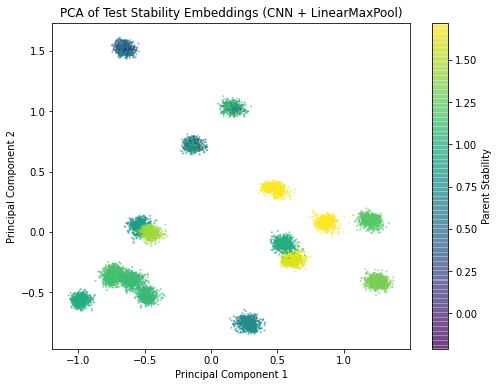

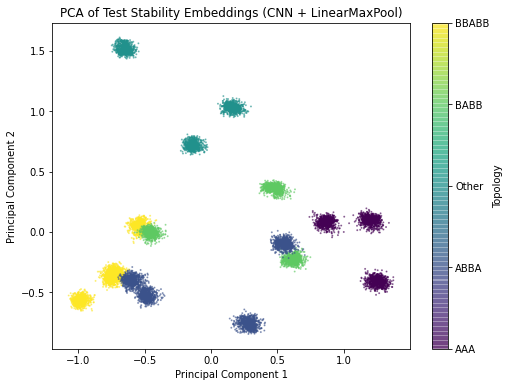

In [ ]:
stability_test_pca_plot(stability_test_embeddings_l, model_name='CNN + LinearMaxPool')

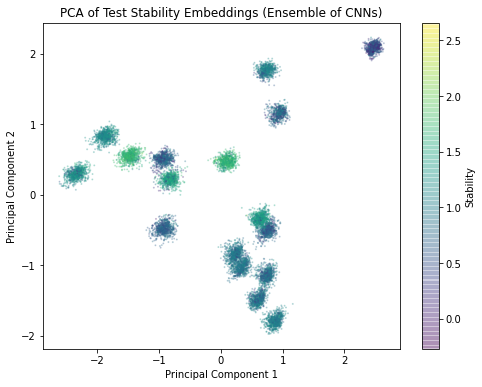

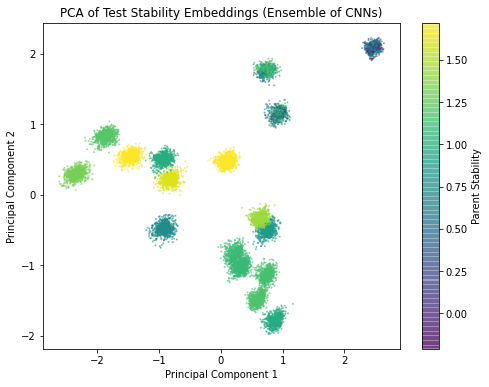

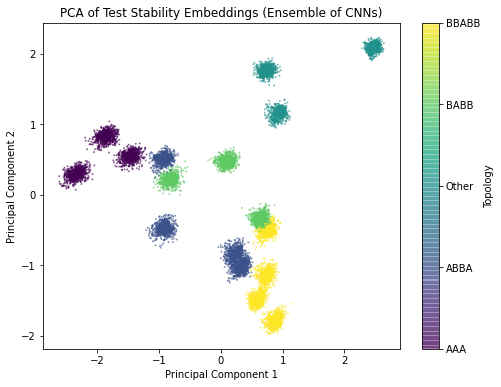

In [ ]:
stability_test_pca_plot(stability_test_embeddings_e, model_name='Ensemble of CNNs')

### Train t-SNE

In [ ]:
def stability_train_tsne_plot(train_embeddings, model_name, num_samples=5000):
  """Applies and plots t-SNE on stability train embeddings."""

  stability_train_df = create_stability_df()

  np.random.seed(0)
  stability_train_pairs = np.random.permutation(np.array([(train_embeddings[i], stability_train_df.stability.values[i], stability_train_df.parent_stability.values[i], stability_train_df.topology_ind.values[i]) for i in range(len(train_embeddings))]))
  sub_stability_train_pairs = stability_train_pairs[:num_samples]

  sub_stability_train_embeddings = np.array([s[0] for s in sub_stability_train_pairs])
  sub_stability_train_stabilities = np.array([s[1] for s in sub_stability_train_pairs])
  sub_stability_train_parent_stabilities = np.array([s[2] for s in sub_stability_train_pairs])
  sub_stability_train_topologies = np.array([s[3] for s in sub_stability_train_pairs])

  stability_train_embeddings_tsne = TSNE(n_components=2).fit_transform(sub_stability_train_embeddings)

  X_tsne_train = [s[0] for s in stability_train_embeddings_tsne]
  Y_tsne_train = [s[1] for s in stability_train_embeddings_tsne]

  plt.figure(figsize=(8, 6))
  plt.scatter(X_tsne_train, Y_tsne_train, c=sub_stability_train_stabilities, s=5, alpha=0.5)
  plt.title('t-SNE of Train Stability Embeddings (' + model_name + ')')
  cbar = plt.colorbar()
  cbar.set_label('Stability')
  plt.show()

  plt.figure(figsize=(8, 6))
  plt.scatter(X_tsne_train, Y_tsne_train, c=sub_stability_train_parent_stabilities, s=5, alpha=0.5)
  plt.title('t-SNE of Train Stability Embeddings (' + model_name + ')')
  cbar = plt.colorbar()
  cbar.set_label('Parent Stability')
  plt.show()

  plt.figure(figsize=(8, 6))
  plt.scatter(X_tsne_train, Y_tsne_train, c=sub_stability_train_topologies, s=5, alpha=0.5)
  plt.title('t-SNE of Train Stability Embeddings (' + model_name + ')')
  topology_names = ['AAA', 'ABBA', 'Other', 'BABB', 'BBABB']
  formatter = plt.FuncFormatter(lambda val, loc: topology_names[val])
  cbar = plt.colorbar(ticks=range(5), format=formatter)
  cbar.set_label('Topology')
  plt.show()

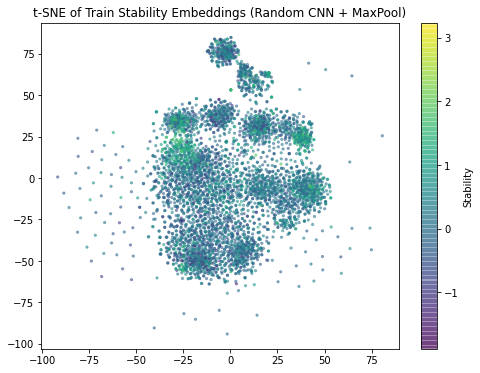

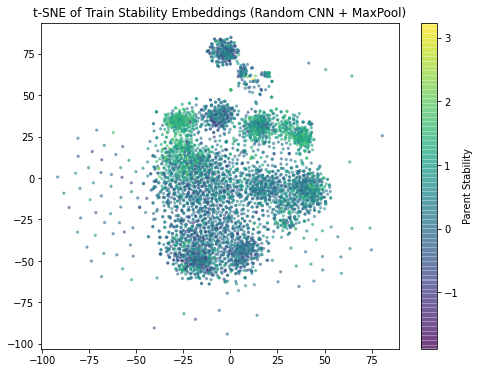

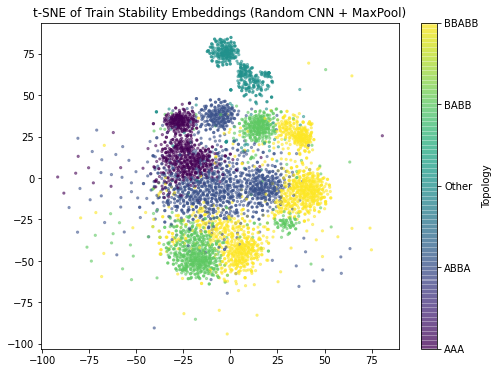

In [ ]:
stability_train_tsne_plot(stability_train_embeddings_random, model_name='Random CNN + MaxPool', num_samples=5000)

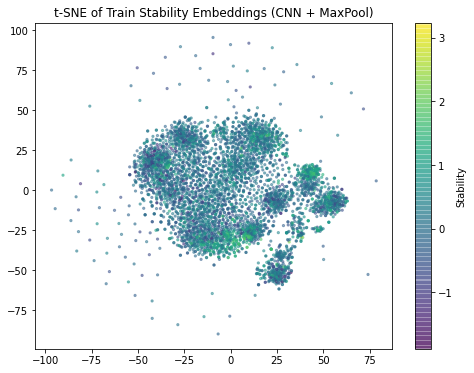

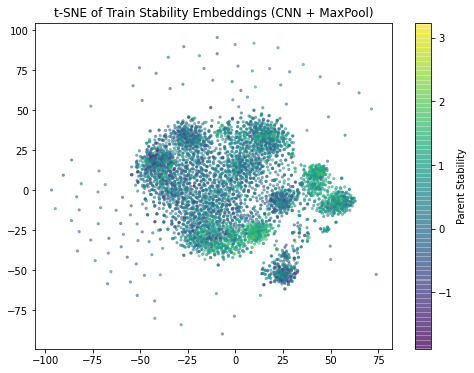

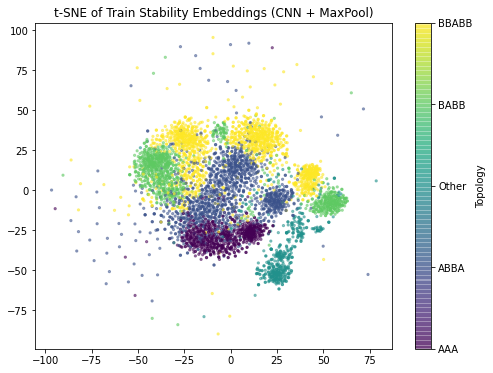

In [ ]:
stability_train_tsne_plot(stability_train_embeddings, model_name='CNN + MaxPool', num_samples=5000)

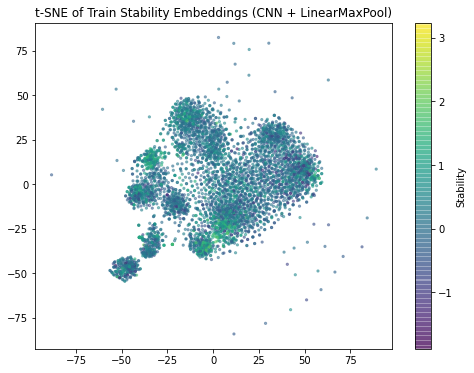

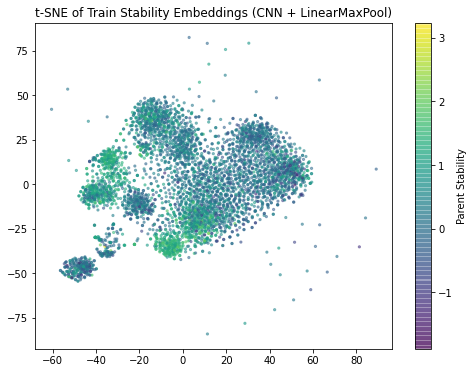

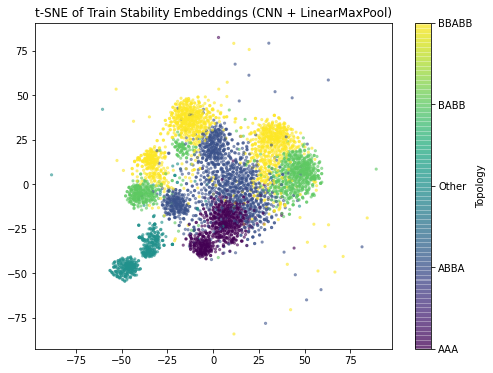

In [ ]:
stability_train_tsne_plot(stability_train_embeddings_l, model_name='CNN + LinearMaxPool', num_samples=5000)

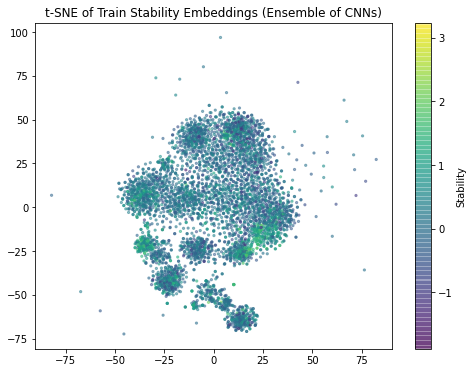

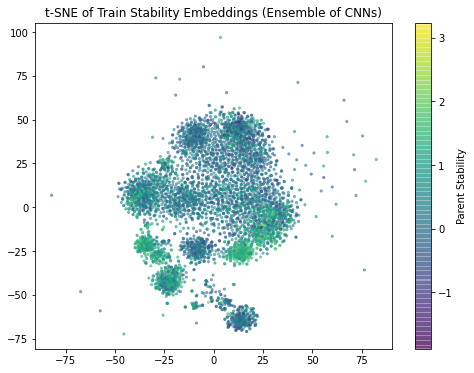

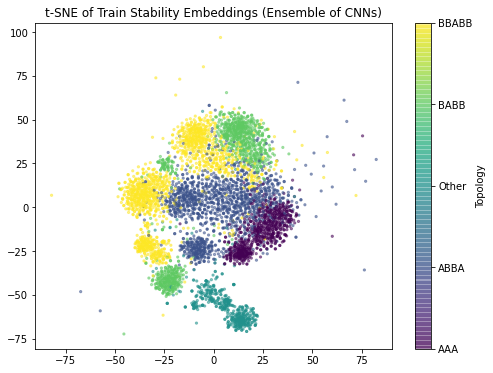

In [ ]:
stability_train_tsne_plot(stability_train_embeddings_e, model_name='Ensemble of CNNs', num_samples=5000)

### Test t-SNE

In [ ]:
def stability_test_tsne_plot(test_embeddings, model_name, num_samples=5000):
  """Applies and plots t-SNE on stability test embeddings."""

  stability_test_df = create_stability_df(test=True)

  np.random.seed(0)
  stability_test_pairs = np.random.permutation(np.array([(test_embeddings[i], stability_test_df.stability.values[i], stability_test_df.parent_stability.values[i], stability_test_df.topology_ind.values[i]) for i in range(len(test_embeddings))]))
  sub_stability_test_pairs = stability_test_pairs[:num_samples]

  sub_stability_test_embeddings = np.array([s[0] for s in sub_stability_test_pairs])
  sub_stability_test_stabilities = np.array([s[1] for s in sub_stability_test_pairs])
  sub_stability_test_parent_stabilities = np.array([s[2] for s in sub_stability_test_pairs])
  sub_stability_test_topologies = np.array([s[3] for s in sub_stability_test_pairs])

  stability_test_embeddings_tsne = TSNE(n_components=2).fit_transform(sub_stability_test_embeddings)

  X_tsne_test = [s[0] for s in stability_test_embeddings_tsne]
  Y_tsne_test = [s[1] for s in stability_test_embeddings_tsne]

  plt.figure(figsize=(8, 6))
  plt.scatter(X_tsne_test, Y_tsne_test, c=sub_stability_test_stabilities, s=5, alpha=0.5)
  plt.title('t-SNE of Test Stability Embeddings (' + model_name + ')')
  cbar = plt.colorbar()
  cbar.set_label('Stability')
  plt.show()

  plt.figure(figsize=(8, 6))
  plt.scatter(X_tsne_test, Y_tsne_test, c=sub_stability_test_parent_stabilities, s=5, alpha=0.5)
  plt.title('t-SNE of Test Stability Embeddings (' + model_name + ')')
  cbar = plt.colorbar()
  cbar.set_label('Parent Stability')
  plt.show()

  plt.figure(figsize=(8, 6))
  plt.scatter(X_tsne_test, Y_tsne_test, c=sub_stability_test_topologies, s=5, alpha=0.5)
  plt.title('t-SNE of Test Stability Embeddings (' + model_name + ')')
  topology_names = ['AAA', 'ABBA', 'Other', 'BABB', 'BBABB']
  formatter = plt.FuncFormatter(lambda val, loc: topology_names[val])
  cbar = plt.colorbar(ticks=range(5), format=formatter)
  cbar.set_label('Topology')
  plt.show()

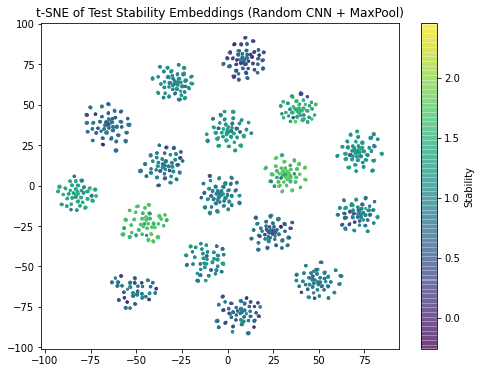

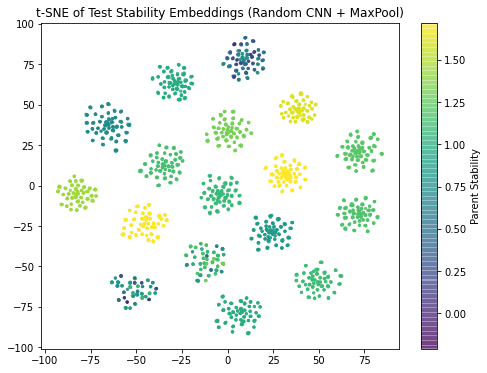

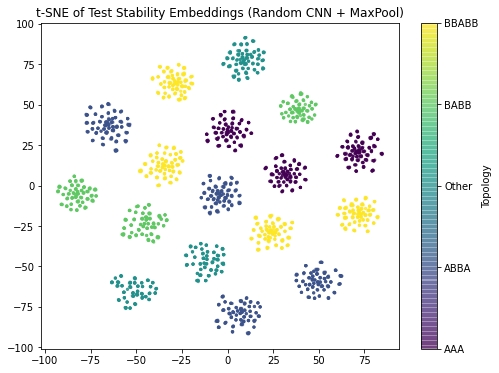

In [ ]:
stability_test_tsne_plot(stability_test_embeddings_random, model_name='Random CNN + MaxPool', num_samples=5000)

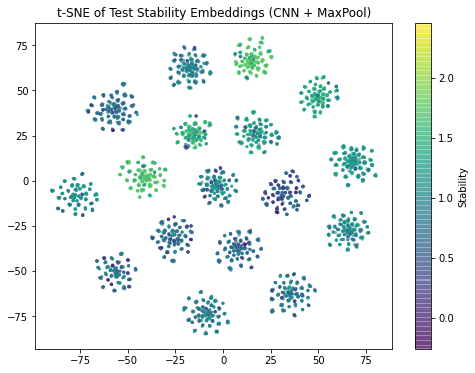

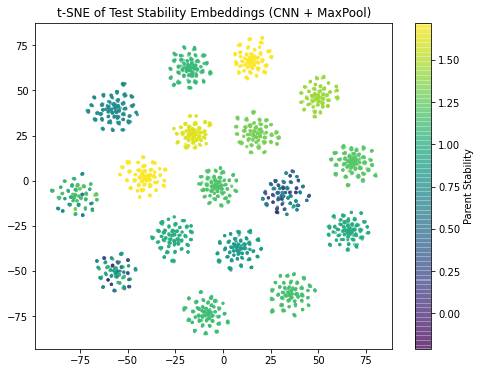

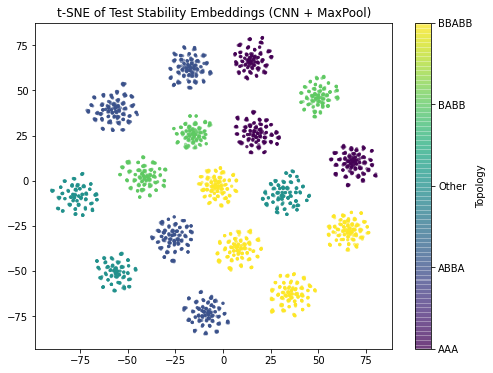

In [ ]:
stability_test_tsne_plot(stability_test_embeddings, model_name='CNN + MaxPool', num_samples=5000)

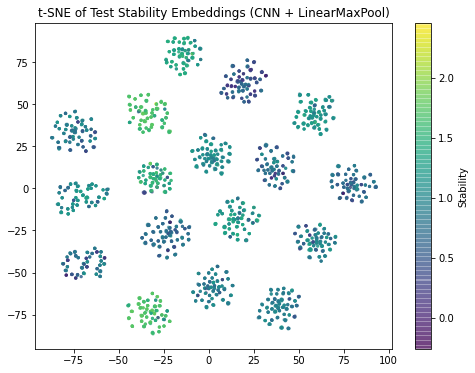

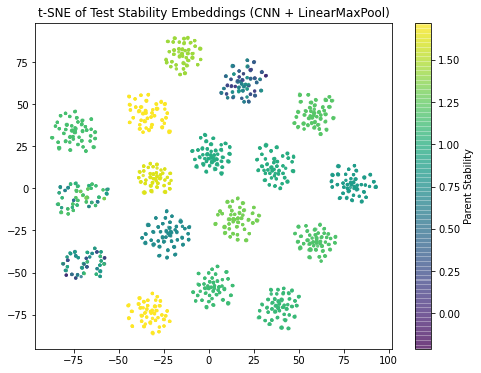

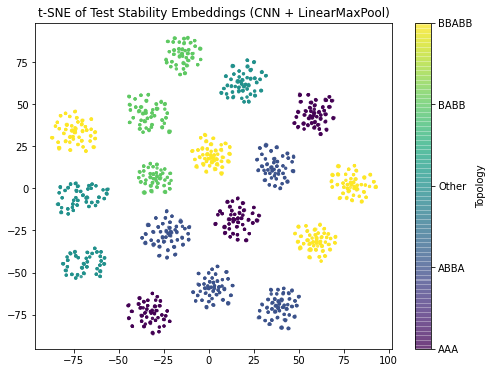

In [ ]:
stability_test_tsne_plot(stability_test_embeddings_l, model_name='CNN + LinearMaxPool', num_samples=5000)

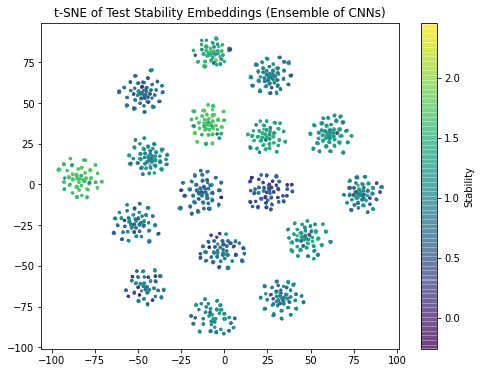

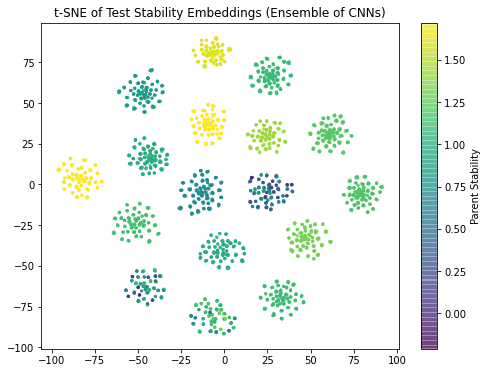

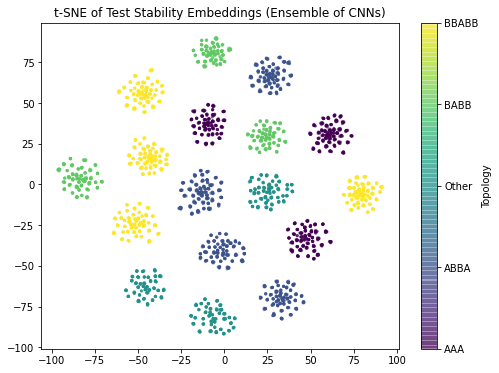

In [ ]:
stability_test_tsne_plot(stability_test_embeddings_e, model_name='Ensemble of CNNs', num_samples=5000)